# HW 3: Lightfields

**HW credits:** *Florian Schiffers and Oliver Cossairt, Northwestern University, Computational Photography [CS331](https://nucs331.github.io/)*

Computational Photography, ELEC 549, Fall 2023, Rice University,

Instructor: Ashok Veeraraghavan

Authors: Sean Farrell, Aniket Dashpute

------




# Part 1: All about lightfields

This is part 1 of homework 3. In this homework we will dive deeper into the concept of how lightfield works.

We acknowledge that the concept of a 4D-lightfield might a bit hard to understand. However, it is one of the most important concepts in Computational Photography and we think it's important for you to understand this better.

HW3 might be a bit lengthy, but we promise it's a lot of fun and very instructive. For this homework we've tried to remove all non-necesseary functions (like plotting and data loading), so that you don't have to implement them, which should save a lot of time.

-----


To understand the concept of light-field better, we show two example images here which show what a light-field is and one application. The application shown here is for calculating a 3D-scene from a light-field.

![test](https://limu.ait.kyushu-u.ac.jp/e/project/image/0003a.jpg)

From: http://limu.ait.kyushu-u.ac.jp/e/project/image/0003a.jpg



![test](https://limu.ait.kyushu-u.ac.jp/e/project/image/0003j.jpg)

From: https://limu.ait.kyushu-u.ac.jp/e/project/image/0003j.jpg

-----

In [1]:
## Imports

from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import glob
import numpy as np
import matplotlib.pyplot as plt
import cv2
import scipy
import scipy.misc
from matplotlib import gridspec
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import skimage
import skimage.morphology
import skimage.transform as skimage_transform
from zipfile import ZipFile

import os

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!pwd
!ls
%cd drive/MyDrive/Ashok_HW3_Code_and_Data/part1_light_field_refocusing

/content
drive  sample_data
/content/drive/MyDrive/Ashok_HW3_Code_and_Data/part1_light_field_refocusing


In [5]:
import sys


# IMPORTANT: Add the util code to colab directory

import util_lightfield as util_lightfield

In [6]:
import numpy as np
import matplotlib.pyplot as plt

VISUALIZE = True

def imshow(img, strTitle="", cbar=False):
    if not VISUALIZE:
        return
    plt.figure()
    plt.imshow(img)#, cmap='gray')
    plt.title(strTitle)
    if cbar:
        plt.colorbar()

def subplots(*args):
    '''
    example:
    subplots([img1, "title1"], [img2, "title2"], ...)
    or
    subplots(img1, img2, ...)
    '''
    # if not VISUALIZE:
    #     return
    fig, axes = plt.subplots(1, len(args), figsize=(15,15))#, sharey=True)
    for i, x in enumerate(args):
        try:
            img = x[0]
            strTitle = x[1]+""
            axes[i].imshow(img, cmap='gray')
            axes[i].set_title(strTitle)
        except:
            axes[i].imshow(x, cmap='gray')
    # plt.show()

def imshowFT(x):
    plt.figure()
    plt.imshow(np.log(np.abs(x)+1))
    plt.colorbar()

def normalize(x):
    return (x-np.min(x))/(np.max(x) - np.min(x))

In [7]:
# unzip the file of images
# fname = "/content/treasure_chest" # You can load a dataset later if you want :)
path = "chess" # for now we're working with the chess-dataset

dir_all = os.listdir(path)


# You can use this to read the files
files = glob.glob(path + "/*.png")
files = sorted(files) # Make sure to sort the file-list otherwise you might get probems
files[0:10]

['chess/out_00_00_-780.134705_-3355.331299_.png',
 'chess/out_00_01_-779.655273_-3351.244873_.png',
 'chess/out_00_02_-779.370178_-3346.097900_.png',
 'chess/out_00_03_-779.797058_-3340.727539_.png',
 'chess/out_00_04_-779.465576_-3335.998291_.png',
 'chess/out_00_05_-779.655518_-3330.550537_.png',
 'chess/out_00_06_-779.328857_-3325.257324_.png',
 'chess/out_00_07_-779.598511_-3320.361328_.png',
 'chess/out_00_08_-779.367920_-3315.136719_.png',
 'chess/out_00_09_-779.593018_-3309.861816_.png']

Now load the data. This is traversing through a bunch of files, so it might take some time. Every file that is loaded should be printed, so you can check how far you are in loading the data.

In [8]:
data = util_lightfield.load_dataset(path+"/",0.5) # 0.5 is for the scaling factor. We don't want to work on the full resolution images

(17, 17, 400, 700, 3)
chess/out_00_00_-780.134705_-3355.331299_.png
chess/out_00_01_-779.655273_-3351.244873_.png
chess/out_00_02_-779.370178_-3346.097900_.png
chess/out_00_03_-779.797058_-3340.727539_.png
chess/out_00_04_-779.465576_-3335.998291_.png
chess/out_00_05_-779.655518_-3330.550537_.png
chess/out_00_06_-779.328857_-3325.257324_.png
chess/out_00_07_-779.598511_-3320.361328_.png
chess/out_00_08_-779.367920_-3315.136719_.png
chess/out_00_09_-779.593018_-3309.861816_.png
chess/out_00_10_-779.422363_-3304.526611_.png
chess/out_00_11_-779.190735_-3299.280029_.png
chess/out_00_12_-779.295410_-3294.000977_.png
chess/out_00_13_-779.193420_-3288.597412_.png
chess/out_00_14_-778.947571_-3283.084229_.png
chess/out_00_15_-779.205078_-3277.917480_.png
chess/out_00_16_-779.041199_-3272.818848_.png
chess/out_01_00_-783.836304_-3354.860352_.png
chess/out_01_01_-783.681396_-3351.084717_.png
chess/out_01_02_-784.052490_-3346.326660_.png
chess/out_01_03_-783.646240_-3340.469482_.png
chess/out_01

In [9]:
# Let's explore our data slighlty
print(data.shape) # If everything went well this should be: (17, 17, 400, 700, 3)

_,_,num_x,num_y,_ = data.shape
print(num_x)
print(num_y)

(17, 17, 400, 700, 3)
400
700


## **Explore:** Visualize cropped versions of the light field

The plot_image_grid functions is already implemented for you. You can play around it's parameter to learn more about the light-field! Please do so to familiarize yourself more with what data we are deadling here with.

.///my_output_lightfield//lightfield_cropped.png


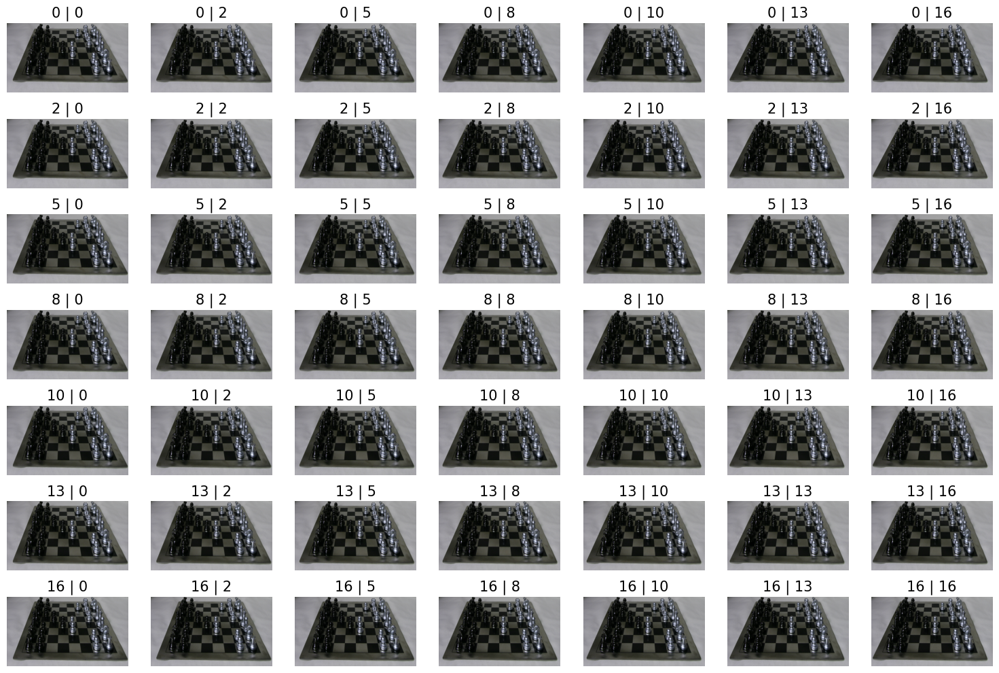

In [10]:
plt.figure(figsize=(15,10))

x0 = int(num_x/4)
y0 = int(num_y/4)

x1 = int(num_x*3.0/4)
y1 = int(num_y*3.0/4)

m_plots = 7
n_plots = 7

util_lightfield.plot_images_grid(data,m_plots, n_plots)#,x0,x1,y0,y1)
plt.tight_layout()

util_lightfield.save_fig_as_png('lightfield_cropped')

## **Explore:** Visualize the complete light field

There's nothing to implement for you. Just use the ".plot_images_grid" function and look at your data

.///my_output_lightfield//lightfield_all.png


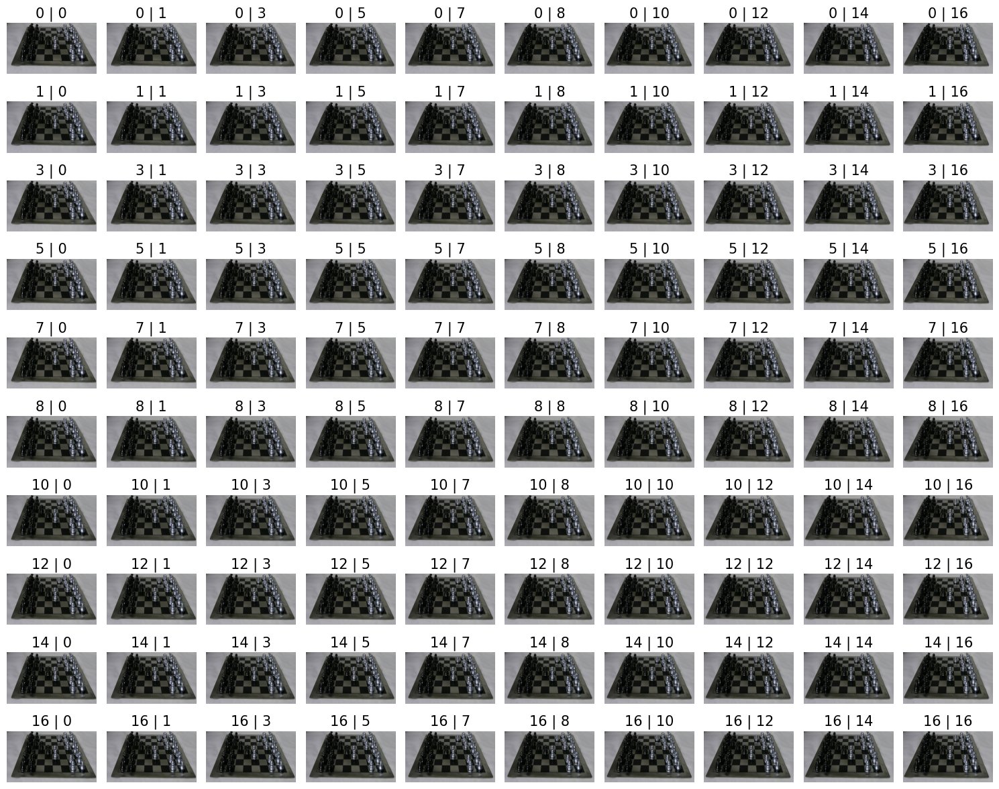

In [11]:
# This will show the complete light-field
plt.figure(figsize=(15,12))
util_lightfield.plot_images_grid(data,10,10)
plt.tight_layout()

util_lightfield.save_fig_as_png('lightfield_all')

## **Explore:** Explore a bit of the light-field interactively with this viewer

There is nothing for you to implement here. The image overview from above is just hard to interprete. We want to make it a bit easier for you understand how this light-field actually looks like.

Note: If the interactive viewer works really slow, then you can use the slider to obtain different images, then right click on the image and open the images in new tabs to compare them

In [12]:
def f(u,v):
    plt.figure(figsize=(15,10))
    print(u,v)
    myim = data[u,v,:,:,:]

    plt.imshow(myim)
    plt.show()

x_widget =  widgets.IntSlider(min=0, max=data.shape[0]-1, step=1)
y_widget = widgets.IntSlider(min=0, max=data.shape[1]-1, step=1)

interactive_plot = interactive(f, u = x_widget, v = y_widget)
output = interactive_plot.children[-1]
interactive_plot

interactive(children=(IntSlider(value=0, description='u', max=16), IntSlider(value=0, description='v', max=16)…

# **Problem 1:** Bilinear Interpolation to interpolate the light-field

The light-field has a fairly large spatial resolution, however the angular resolution is only $17 \times 17$. That means we can only jump into views that are exactly captured at the specific camera positions.

However, using bilinear inerpolation we can simulate views from arbitrary positions. Bilinear interpolation is a very powerful image-processing technique which is well implemented in openCV and other packages. However, those packages don't work with 4D-lightfields.

In the next cells you will implement your own bilinear-interpolation code. We'll start with implementation in 2D and slowly improve your code until you are able to implement 4D-lightfields.

----

A good introduction to **bilinear-interpolation** is provided by the wikipedia page on: https://en.wikipedia.org/wiki/Bilinear_interpolation

---

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/9/9d/BilinearInterpolationV2.svg/1024px-BilinearInterpolationV2.svg.png" width="300">

`Figure 1: The four red dots show the data points and the green dot is the point at which we want to interpolate. (from Wikipedia)`

---
        
You don't have to read the whole article, since we're already extracting the most important formula for you:

<center> $ f(x,y) =  f(Q_{11})(x_2 - x)(y_2 - y)  + f(Q_{21})(x - x_1)(y_2 - y) + f(Q_{12})(x_2 - x)(y - y_1) + f(Q_{22})(x - x_1)(y - y_1)$</center>


\\
Note that we're here ommitting the factor $\frac{1}{(x_2 - x_1)\cdot(y_2 - y1)}$

**Why can we do this?** Think about what $x_2$ is in our case. It's defined as $x_2 = x_1 + 1$ since we are working on a regular grid and always interpolating between consecutive positions on the grid. Hence the difference will always be 1.

---

## **Problem 1.1:** Bilinear interpolation on sample image in 2D



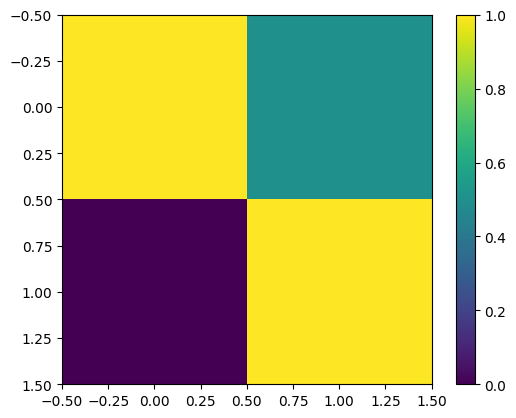

In [13]:
# This is a very easy 2x2 matrix. We want to interpolate the values in-between
my_test_img = np.array([[1,0.5],[0,1]])
plt.imshow(my_test_img)
plt.colorbar()

Now you have to implement the bilinear interpolation for this test image.

Here's an interpolation very close to what we need:
https://gist.github.com/peteflorence/a1da2c759ca1ac2b74af9a83f69ce20e
( which is taken from this discussion https://stackoverflow.com/questions/8661537/how-to-perform-bilinear-interpolation-in-python )

NOTE: This implementation will not work completely. There are still some slight changes that you'll need to perform, but it's a very good starting point.

I recommend copying this code over in a cell and trying it out line-by-line. It's really important that you understand what each line in this code is doing and WHY it is needed.

In [14]:
def bilinear_interpolate_numpy_matrix(data, x_given, y_given):
    """
    TODO:

    Performs bilinear interpolation on 2D matrix with dimension
    2 x 2
    The locations where you should interpolate are passed by
    the matrices x and y which are in meshgrid format.

    HINT: Do NOT use forloops!

    HINT: https://gist.github.com/peteflorence/a1da2c759ca1ac2b74af9a83f69ce20e
    You can copy this code over in a cell in jupyter and play around with
    it until it works. You might want

    HINT: Think about what each step is doing here. You need to understand it.
    You may have to adjust the code not only concerning the variable names but also the order etc.


    Args:
        data(ndarray): 2D-Array with dimension 2 x 2
        x(ndarray): Meshgrid for coordinates in x
        y(ndarray): Meshgrid for coordinates in y

    """
    rows, cols = data.shape
    x_0s = np.clip((np.floor(x_given)).astype(int), 0, cols - 1)
    y_0s = np.clip((np.floor(y_given)).astype(int), 0, rows - 1)

    x_1s = np.clip((np.ceil(x_given)).astype(int), 0, cols - 1)
    y_1s = np.clip((np.ceil(y_given)).astype(int), 0, rows - 1)

    Ia = data[y_0s, x_0s]
    Ib = data[y_0s, x_1s]
    Ic = data[y_1s, x_0s]
    Id = data[y_1s, x_1s]

    x_weight = x_given - np.floor(x_given)
    y_weight = y_given - np.floor(y_given)

    return (Ia * (1 - x_weight) * (1 - y_weight) +
           Ib * x_weight * (1 - y_weight) +
           Ic * (1 - x_weight) * y_weight +
           Id * x_weight * y_weight)

.///my_output_lightfield//bilinear_matrix_3x3.png


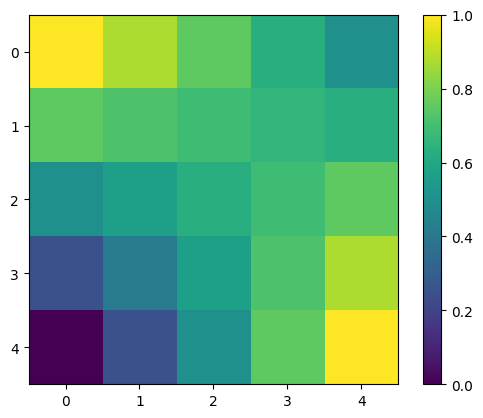

In [15]:
# Let's create the values where we want to interpolate
N_new = 5
xx = np.linspace(0,1,N_new)

[X,Y] = np.meshgrid(xx,xx)

out = bilinear_interpolate_numpy_matrix(my_test_img,X,Y)
plt.imshow(out)
plt.colorbar()

util_lightfield.save_fig_as_png('bilinear_matrix_3x3')

.///my_output_lightfield//bilinear_matrix_50x50.png


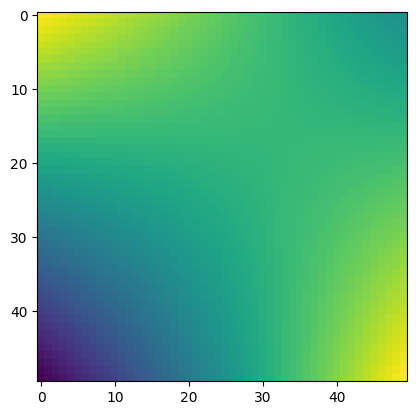

In [16]:
# Let's do the same for N_new = 100 (should look like a very smooth image)
N_new = 50
xx = np.linspace(0,1,N_new)
[X,Y] = np.meshgrid(xx,xx)

out = bilinear_interpolate_numpy_matrix(my_test_img,X,Y)
plt.imshow(out)

util_lightfield.save_fig_as_png('bilinear_matrix_50x50')

## **Problem 1.2:** Bilinear interpolation on test image

Now test if your algorithm still works for 2D images. Copy your code from "bilinear_interpolate_numpy_matrix"
to "bilinear_interpolate_numpy_2D_image".

If implemented correctly, this should work right away. If not, adapt it until it works. We create a second function, so that you're not losing your implementation and you can start over at any time.

In [17]:
def bilinear_interpolate_numpy_2D_image(data, x_given, y_given):
    """
    TODO:

    Performs bilinear interpolation on 2D matrix with
    arbitrary size.

    You can start with your implementation from bilinear_interpolate_numpy_matrix
    and check if it works wells. If not, adapt it

    The locations where you should interpolate are passed by
    the matrices x and y which are in meshgrid format.

    HINT: Do NOT use forloops!

    HINT: Think about what each step is doing here. You need to understand it

    HINT: https://gist.github.com/peteflorence/a1da2c759ca1ac2b74af9a83f69ce20e
    You can copy this code over in a cell in jupyter and play around with
    it until it works.

    Args:
        data(ndarray): 2D-Array with dimension NxN
        x(ndarray): Meshgrid for coordinates in x
        y(ndarray): Meshgrid for coordinates in y

    """

    # since the method implemented above is already for any dimension
    out = bilinear_interpolate_numpy_matrix(data, x_given, y_given)

    return out

In [18]:
img = skimage.data.camera()

img_down = skimage_transform.rescale(img,0.25)

xx = np.linspace(0,img_down.shape[0],img.shape[0])
yy = np.linspace(0,img_down.shape[1],img.shape[0])

[X,Y] = np.meshgrid(xx,yy)

img_up = bilinear_interpolate_numpy_2D_image(img_down,X,Y)

print(np.min(img_up))
print(np.max(img_up))

0.01269685671944405
0.9733318481861395


.///my_output_lightfield//bilinear_cameraman.png


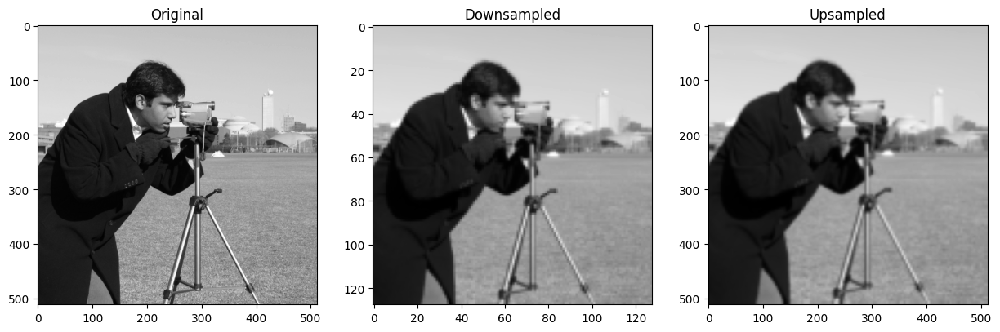

In [19]:
# Use this code to visualize if this worked well
subplots([img, "Original"], [img_down, "Downsampled"], [img_up, "Upsampled"])

# Save the output
util_lightfield.save_fig_as_png('bilinear_cameraman')

## **Problem 1.3:** Modify Bilinear interpolation to work with arbitrary color images with arbitrary shapes

Now we go one step further. Instead of gray-scale images that are of square size, you now have to adapt your method, so that it workes for RGB-images that are rectangular.

Copy your implementation from "bilinear_interpolate_numpy_2d_image" to "bilinear_interpolate_numpy_RGB_image" and modify it to incorporate 3 channels.

In [20]:
def bilinear_interpolate_numpy_RGB_image(data, x_given, y_given):
    """
    TODO:

    Performs bilinear interpolation on an RBG image
    that can have arbitrary dimension (e.g. 300x500x3)

    You can start with your implementation from bilinear_interpolate_2D_image
    and check if it works wells. If not, adapt it.


    HINT: You don't have to use for-loops to deal with the
    color channels. You can achieve everything using
    the .T operator smartly which will do array broadcasting for you

    HINT: You might want to use transpose in the end
    to get the correct image dimensions order.

    Args:
        data(ndarray): RGB image with arbitrary dimensions
        x(ndarray): Meshgrid for coordinates in x
        y(ndarray): Meshgrid for coordinates in y

    """
    # since theyre meshgrids, y and x given have same dims -- desired image dims
    out = np.zeros((y_given.shape[0], y_given.shape[1], data.shape[2]))

    # placeholder just use a for loop for the channels
    for chan in range(data.shape[2]): # assume it's arranged this way
      out[:,:,chan] = bilinear_interpolate_numpy_2D_image(data[:,:,chan], x_given, y_given)
    out = out.astype('uint8')
    return out

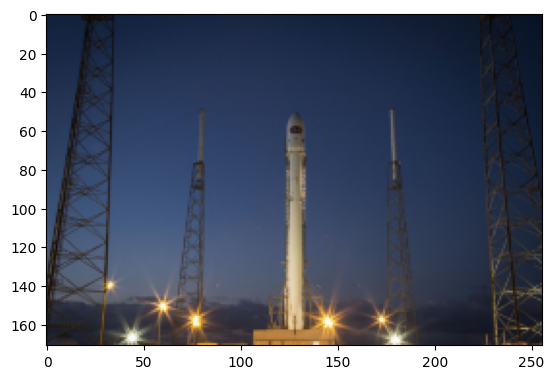

In [21]:
img = skimage.data.rocket()

scale = 0.4

dw = skimage_transform.rescale(img[:,:,0],scale).shape
img_down = np.zeros((dw[0],dw[1],3))


for k in range(0,3):
    img_down[:,:,k] = skimage_transform.rescale(img[:,:,k],scale)

# We have to cast it back to uint8
img_down = (255*img_down).astype(np.uint8)

plt.imshow(img_down)

### Test your bilinear upsampler

(427, 640) (427, 640)
.///my_output_lightfield//bilinear_matrix_rocket.png


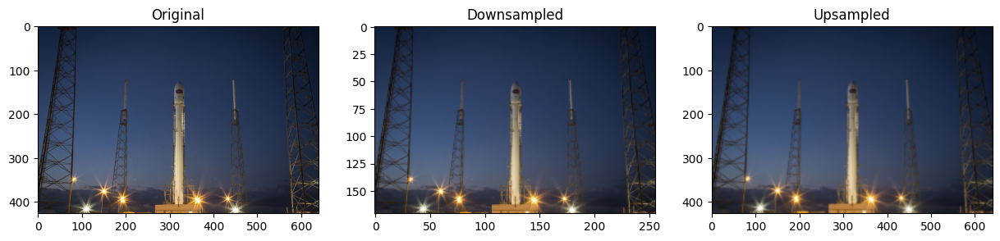

In [22]:
# changed the order of xx and yy. xx now represents the x-direction( horizontal)
xx = np.linspace(0,img_down.shape[1],img.shape[1])
yy = np.linspace(0,img_down.shape[0],img.shape[0])

[X,Y] = np.meshgrid(xx,yy)
print(X.shape, Y.shape)

img_up = bilinear_interpolate_numpy_RGB_image(img_down,X,Y)

subplots([img, "Original"], [img_down, "Downsampled"], [img_up, "Upsampled"])

util_lightfield.save_fig_as_png('bilinear_matrix_rocket')

## **Problem 1.4:** Test Bilinear interpolation of one light-field pixel-image

Now comes the most interesting part:

Our lightfield data has the following data shape: (N_u,N_v,N_x,N_y,N_col)

where
 1. N_u and N_v are the angular components (those are small)
 2. N_x and N_y are the spatial dimensions (those are large)
 3. N_col should be 3 for 3 colors

Copy your code from "bilinear_interpolate_numpy_RGB_image" over to "bilinear_interpolate_numpy". Your implementation will be starting point for interpolating the light-field.

In [23]:
# Just for reminding us of the light-field dimensions
print(data.shape)

(17, 17, 400, 700, 3)


(17, 17, 3)
uint8


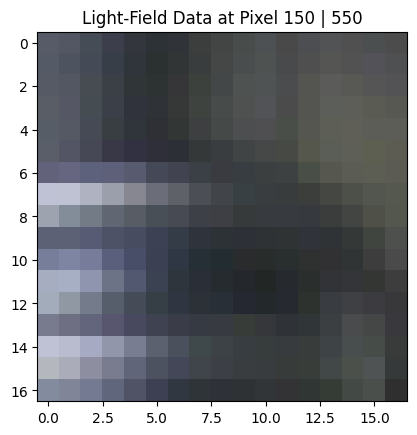

In [24]:
# Let's start out with subsampling a simple RGB image
# This should work without any problem

x = 150
y = 550
sub_data = data[:,:,x,y,:]
print(sub_data.shape)

plt.imshow(sub_data)
plt.title("Light-Field Data at Pixel " + str(x) + " | " + str(y))

print(sub_data.dtype)

(100, 100, 3)


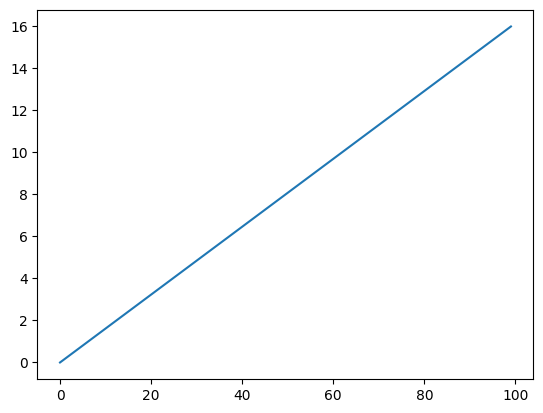

In [25]:
# Let's create an array that goes from 0 to 17 (min to max) with 100 points to sample from in between
xx = np.linspace(0,16,100)

plt.plot(xx)

[X,Y] = np.meshgrid(xx,xx)

lf_up = bilinear_interpolate_numpy_RGB_image(sub_data, X, Y )

print(lf_up.shape)
# This should now be an array of dimension (100,100,3).
# We have upsampled our lightfield images from 17x17 to 100x100.
# That means instead of 17x17 views we now have 100^2 views (10k which is quite a lot)
lf_up = np.clip(lf_up, 0, 255).astype(np.uint8)

.///my_output_lightfield//bilinear_lightfield_2d.png


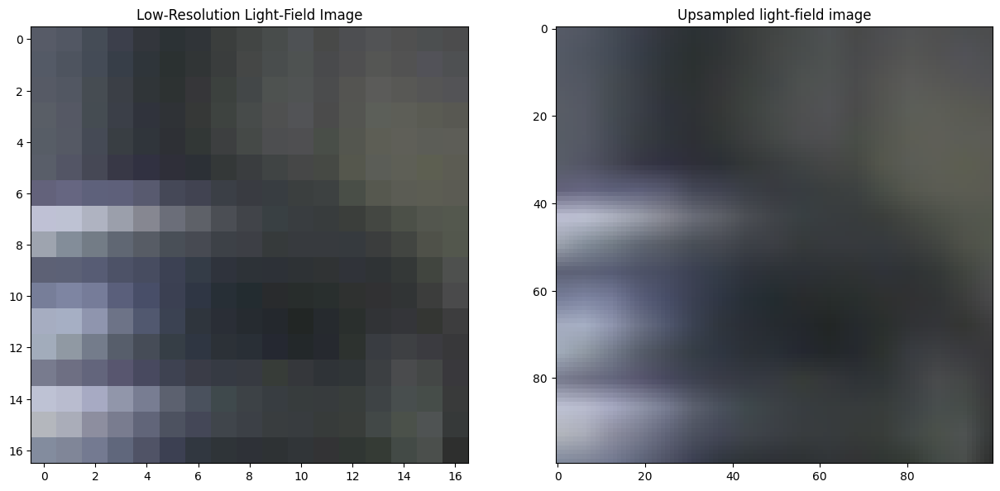

In [26]:
subplots([sub_data, "Low-Resolution Light-Field Image"], [lf_up, "Upsampled light-field image"])

util_lightfield.save_fig_as_png('bilinear_lightfield_2d')

## **Problem 1.5:** Bilinear interpolation for all light-field pixel-image

This will be the trickiest part ! We now need to perform this interpolation for each spatial pixel ( we have a lot of those !!!)! With a 1Mpx light-field (the original data are actually larger! those are already 1 Million interpolations).

Since we are writing in Python, we cannot use 2 for-loops for this because it would become incredibly slow. Fortunately, numpy vector-math (using broadcasting) is doing this magic for us. You only have to lern how to this!

In [27]:
def bilinear_interpolate_numpy(data, x_given, y_given):
    """
    Performs bilinear interpolation on an RGB-lightfield.

    Args:
        data (ndarray): RGB-lightfield with shape (17, 17, N, M, 3)
        x_given (ndarray): Meshgrid for coordinates in x
        y_given (ndarray): Meshgrid for coordinates in y

    Returns:
        out (ndarray): Interpolated RGB-lightfield with shape (x_given.shape[0], y_given.shape[1], data.shape[2], data.shape[3], 3)
    """

    # similar format to interpolating image, but this time we have to take into account the viewpoint as well -- put that inside the vector math stuff too
    # all dimensionality

    x_0s = np.floor(x_given).astype(int)
    y_0s = np.floor(y_given).astype(int)
    x_1s = x_0s + 1
    y_1s = y_0s + 1

    x_0s = np.clip(x_0s, 0, data.shape[0] - 1)
    y_0s = np.clip(y_0s, 0, data.shape[1] - 1)
    x_1s = np.clip(x_1s, 0, data.shape[0] - 1)
    y_1s = np.clip(y_1s, 0, data.shape[1] - 1)

    # x, y AWAY from a corner means more weight to opposite corner
    weight_right = x_given - x_0s
    weight_bot = y_given - y_0s
    weight_left = 1 - weight_right
    weight_top = 1 - weight_bot

    top_left = data[x_0s, y_0s]
    top_right = data[x_1s, y_0s]
    bottom_left = data[x_0s, y_1s]
    bottom_right = data[x_1s, y_1s]


    interpolated_values = (
        weight_left[:, :, None, None, None] * weight_top[:, :, None, None, None] * top_left +
        weight_right[:, :, None, None, None] * weight_top[:, :, None, None, None] * top_right +
        weight_left[:, :, None, None, None] * weight_bot[:, :, None, None, None] * bottom_left +
        weight_right[:, :, None, None, None] * weight_bot[:, :, None, None, None] * bottom_right

    )

    interpolated_values = interpolated_values.astype('uint8')

    return interpolated_values.transpose(1, 0, 2, 3, 4)

In [28]:
# We'll start with a small subset of only a 2x4 images (we use 2 x 4 to have different dimnsions for you to test)
# We also change the numbers in the lightfield for u and v direction to make sure we don't mess up the order of dimensions!

sub_data = data[0:15,0:14,150:152,550:554,:]

print("sub_datas", sub_data.shape)

xx = np.linspace(0,16,32) #
yy = np.linspace(0,15,30) #

[X,Y] = np.meshgrid(xx,yy)
print(X.shape, Y.shape)
lf_up = bilinear_interpolate_numpy(sub_data,X,Y)
print("lf_up", lf_up.shape)

# The last 3 dimensions shoudld be the same as sub_data.shape !!!
# this shou'd be (32, 30, 2, 4 ,3) according to the dimensions that we've chosen above.
# If you choose e.g. 36 points to interpolate instead of 34 it should change accordingly.
# Make sure that this works well before you move on


sub_datas (15, 14, 2, 4, 3)
(30, 32) (30, 32)
lf_up (32, 30, 2, 4, 3)


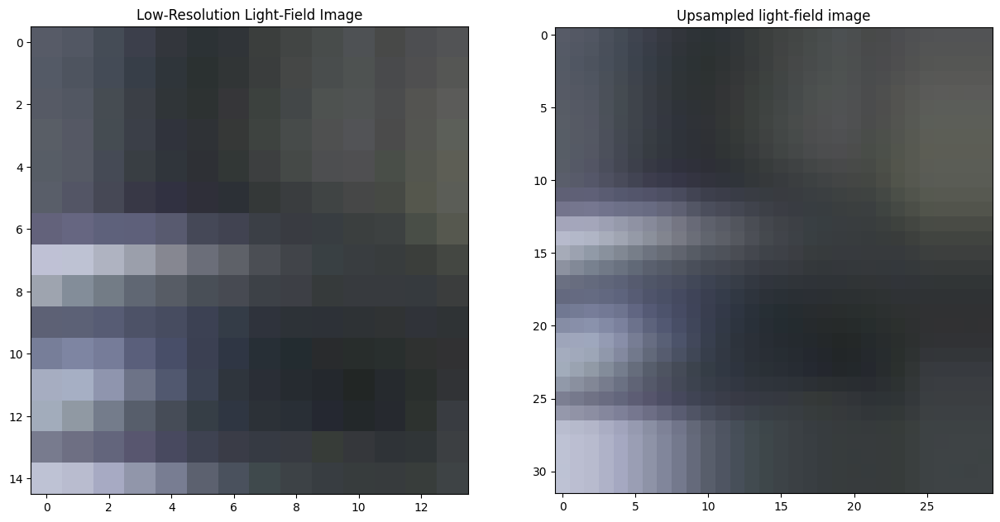

In [29]:
subplots([sub_data[:,:,0,0,:].squeeze(), "Low-Resolution Light-Field Image"], [lf_up[:,:,0,0,:].squeeze(), "Upsampled light-field image"])

(17, 17, 52, 54, 3)
(34, 34, 52, 54, 3)
.///my_output_lightfield//bilinear_matrix_lightfield_chess.png


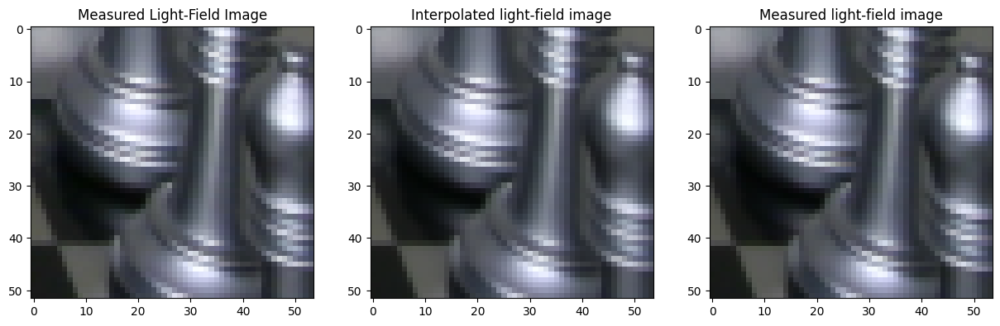

In [30]:
# Now that you've implemented this for sub part, check if it also works for a larger lightfield!

# We're now interpolating the 4D-lightfield along the u-v axis. However, we're not doing it for the complete image yet, but only for a subsection
sub_data = data[:,:,100:152,500:554,:]

print(sub_data.shape)

xx = np.linspace(0,17,34)

[X,Y] = np.meshgrid(xx,xx)

lf_up = bilinear_interpolate_numpy(sub_data,X,Y)

print(lf_up.shape) # The last 3 dimensions shoudld be the same as sub_data.shape !!!

# This is the same as the (0|0) from the original dataset
I1 = [sub_data[0,0,:,:,:].squeeze(), "Measured Light-Field Image"];

# Please realize that the lf_up at position 1|1 is an interpolated image (!) and not a captured dataset
# Think of it as (0.5|0.5) from the original dataset
# This image should look almost the same, but it would be slighlty shifted in one direction.
I2 = [lf_up[1,1,:,:,:].squeeze(), "Interpolated light-field image"]

# Please realize that the lf_up at position 2|2 is a measured image again!
# Think of it as (1|1) from the original dataset
I3 = [lf_up[2,2,:,:,:].squeeze(), "Measured light-field image"]

subplots(I1, I2, I3)

util_lightfield.save_fig_as_png('bilinear_matrix_lightfield_chess')

## **Problem 1.6:** Use your bilinear interpolation function to write an interactive light-field interpolator

No worries, we have implemented the interactive light-field viewer for you! As long as your "bilinear_interpolate_numpy" works, you're in good shape!



In [31]:
def f(m, b):
    plt.figure(figsize=(15,10))
    print("m: ", m)
    print("b: ", b)

    myim = bilinear_interpolate_numpy(data,m,b)
    print(myim.shape)

    plt.imshow(myim)
    plt.show()

x_widget =  widgets.FloatSlider(min=1, max=data.shape[0]-1, step=0.25)
y_widget = widgets.FloatSlider(min=1, max=data.shape[1]-1, step=0.25)
print("x: ", x_widget)
print("y: ", y_widget)

interactive_plot = interactive(f, m = x_widget, b = y_widget)
output = interactive_plot.children[-1]
interactive_plot

x:  FloatSlider(value=1.0, max=16.0, min=1.0, step=0.25)
y:  FloatSlider(value=1.0, max=16.0, min=1.0, step=0.25)


interactive(children=(FloatSlider(value=1.0, description='m', max=16.0, min=1.0, step=0.25), FloatSlider(value…

<Figure size 1500x1000 with 0 Axes>

---

---

# **Problem 2:** Digital Refocusing in 1D

In this section we will now explore how we can use the lightfield to digitally refocus

The original implementation comes from Ren Ng et al. [1] which was later implemented in a product called Lytro, which was also founded by Ren Ng [2].

I recommend giving those 2 papers a quick read. They are very informative and should help developping a much better understanding of light-fields.

References

[1] http://graphics.stanford.edu/papers/CameraArray/CameraArray_Sig05.pdf <br>
[2] https://graphics.stanford.edu/papers/lfcamera/lfcamera-150dpi.pdf

---

## **Problem 2.1:** Refocus in 1D

Before we're diving into refocusing our lightfield, we want to implement everything on 1D-signals which we extract from our lightfield. This will help us build a much better intuition what we'll have to do in 2D later on. Conceptually it is the same.

(17, 17, 400, 700, 3)


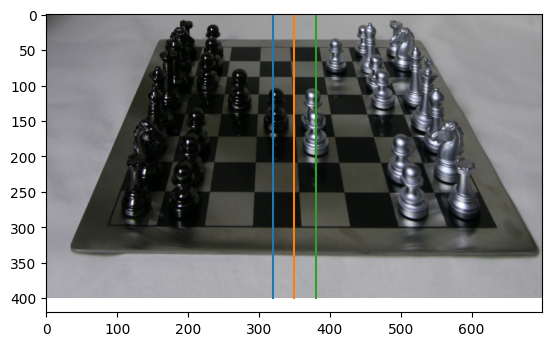

In [32]:
# First we extract 3 different columns from our lightfield dataset and choose one v-coorindate of the lightfield.
y = [320, 350,380]
v = 8

print(data.shape)

# Let us visualize this data so that we get an understanding what data we'll be working with now
plt.imshow(data[0,0,:,:])
plt.plot([y,y],[0,data.shape[2]])

Now we will extract the 1D-lightfield for each of the 3 lines. In total we will have 17 light-field positions per pixel. There is nothing for you to implement. Just look at the code so that you understand it and then try to analyze the pictures.

.///my_output_lightfield//bilinear_1d.png


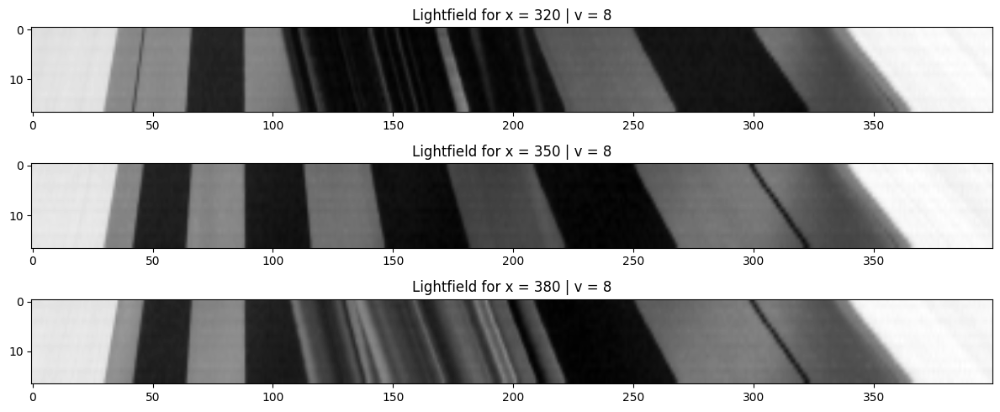

In [33]:
plt.figure(figsize = (12,5))
for k in range(len(y)):
    plt.subplot(len(y),1,k+1)
    img = data[:,v,:,y[k],0].squeeze()
    plt.imshow(img,interpolation="bilinear", aspect="auto",cmap='gray')
    plt.title("Lightfield for x = " + str(y[k]) + " | v = " + str(v))
plt.tight_layout()

util_lightfield.save_fig_as_png('bilinear_1d')

#as u becomes lager we are shifting up, so that the length of the chessboard appears to be larger. consider extreme situations.
#Slope indicates rate of change of the length of a certain feature.

We will now only work with one v-y slice which is at located at x = 350 because it has clear differences between black and white. This will make debugging and understanding of our lightfield refocusing the easiest.

In [34]:
print(data.shape)

(17, 17, 400, 700, 3)


.///my_output_lightfield//bilinear_1d_example.png


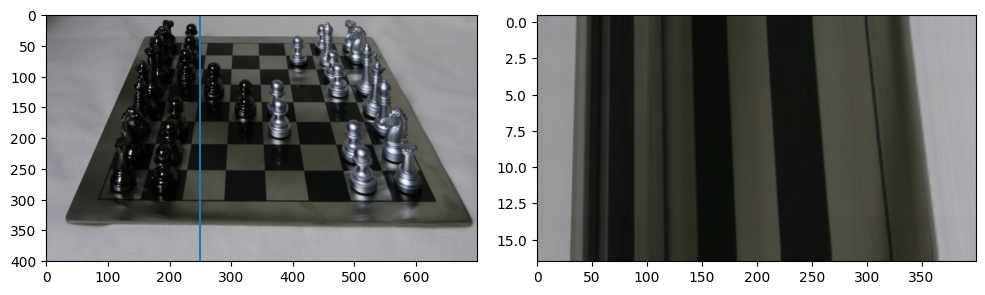

In [35]:
# Extract the data we want
y = [250]
v = 6

img = data[2,2,:,:]

# Visualize the data

# We are doing this for you. Feel free to play around with this and visualize different light-field coordinates.
# This is not a must, but it can very instructive for people who want to dig in a bit more!

plt.figure(figsize=(10,3))

plt.subplot(121)
plt.ylim([0,data.shape[2]])
plt.plot([y,y],[0,data.shape[2]])
plt.imshow(img)
plt.gca().invert_yaxis()

plt.subplot(122)
plt.imshow(data[:,v,:,y[0]],interpolation="bilinear", aspect="auto",cmap='gray')
plt.tight_layout()

util_lightfield.save_fig_as_png('bilinear_1d_example')

## **Problem 2.2:** Explore the image in 1D-interactive view</span>

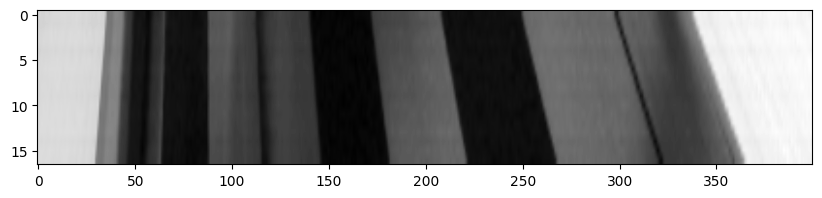

In [36]:
# Now we extract only one 1D-lightfield image. Let's visualize quickly
# img has u-x data for given v = 8, y = 350, color_channel = 0
img = data[:,v,:,y[0],0]
plt.figure(figsize=(10,2))
plt.imshow(img,interpolation="bilinear", aspect="auto",cmap='gray')

### **Subtask:** 1D-interactive view

We have implemented an interactive 1D light-field viewer for you. Please play around with the slider to visualize your 1D-lightfield. There is no coding or writing task, just analze it so that you develop a better understanding of it.

In [37]:
def f(u):
    plt.figure(figsize=(10,4))

    plt.subplot(211)
    plt.plot(img[u,:])
    plt.title("V-idx: " + str(u))
    plt.xlim(0,img.shape[1]-1)

    plt.subplot(212)
    plt.imshow(img,interpolation="bilinear", aspect="auto",cmap='gray')
    plt.plot([0,img.shape[1]],[u,u])
    plt.xlim(0,img.shape[1])

    plt.show()

u_widget =  widgets.IntSlider(min=0, max=img.shape[0]-1, step=1)

interactive_plot = interactive(f, u = u_widget)
output = interactive_plot.children[-1]
interactive_plot

interactive(children=(IntSlider(value=0, description='u', max=16), Output()), _dom_classes=('widget-interact',…

### **Subtask:** Look at the mean and individual lines

Execute the following cell. There is nothing suprising there, it should just help you a bit better in understanding our data.

(4, 400)


Text(0.5, 1.0, 'mean image')

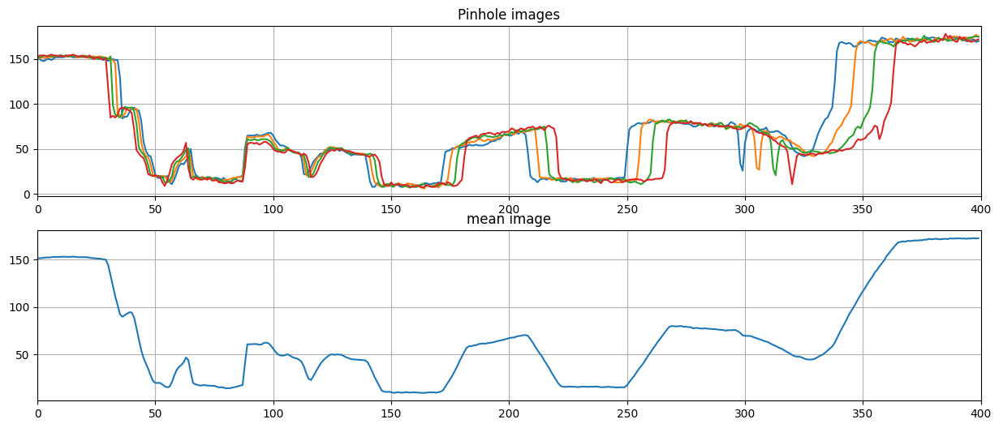

In [38]:
plt.figure(figsize=(15,6))

plt.subplot(211)
# sample in the first dimension of img at a gap of k -> img[::k,:]
# img is u-x image
print(img[::5,:].shape)
plt.plot(img[::5,:].T)
plt.xlim(0,img.shape[1])
plt.title("Pinhole images")
plt.grid()

plt.subplot(212)
plt.plot(img.mean(axis=0))
plt.xlim(0,img.shape[1])
plt.grid()
plt.title("mean image")

## **Problem 2.3:** Understand the refocusing formula in 1D

This formula is taken from Ren Ng's [paper](https://graphics.stanford.edu/papers/lfcamera/lfcamera-150dpi.pdf) on lightfield refocusing. Instead of working in 2D, we're here having a 1D-version of the lightfield for simpler understanding

---

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/LFM-refocus.png/1920px-LFM-refocus.png" width="500">

`Figure: Modified figure for 1 dimensional refocus from the above paper (page 4 bottom figure), image source: https://en.wikipedia.org/wiki/Light_field_microscopy`

---

<h1><center>$E(s') = \int L \left( u,s' - ( 1 - \alpha ) \cdot u  \right) du$</center></h1>

Here $\alpha$ represents the refocus parameter (i.e. this encodes the focus distance). $L$ is the lightfield which is saved in our "img" variable. $u$ is the coordinate where the camera is shifted at and $s$ is the location on the detector.

How does this look in a discretized version? Instead of an integral we now have a discretized sum over $u_k$.

<h1><center>$E(s') = \sum\limits_k L \left( u_k,s' - ( 1 - \alpha ) \cdot u_k  \right)$</center></h1>

If you look at this formula a bit longer, you will realize that his is nothing than adding several images together. However, each of this images is now slightly shifted, by the value $(1-\alpha)\cdot u$ which depends on the position $u$.

## **Problem 2.4:** Calculate the amount of pixel shift

Now you will have to implement the get_shift_1D function that will give you for each u-light field coordinate the amount the 1D-signal needs to be shifted.

The amount that needs to be shifted can be easily extracted from the formula above as

$$ (1 - \alpha)\cdot u_k $$


In [39]:
def get_shift_1D(img,alpha):
    """
    TODO:

    Calculates the shifts for each light-field position

    Formula given by: $$ (1 - \alpha)\cdot u_k $$

    Where u_k is the light-field coordinate ranging from
    -img.shape[0]/2.0 up to img.shape[0]/2.0

    Args:
        img(ndarray): 2D-lightfield image with shape (17x300)
        alpha(float): refocus parameter

    Returns:
        shifts(ndarray): 1D-array with shape (17x1) with shifts for each view

    """
    # interpolate between views with u being in the center
    u_values = np.arange(-img.shape[0] / 2.0, img.shape[0] / 2.0, 1.0)
    shifts = (1 - alpha) * u_values
    return shifts

(17,)
.///my_output_lightfield//shift_1d.png


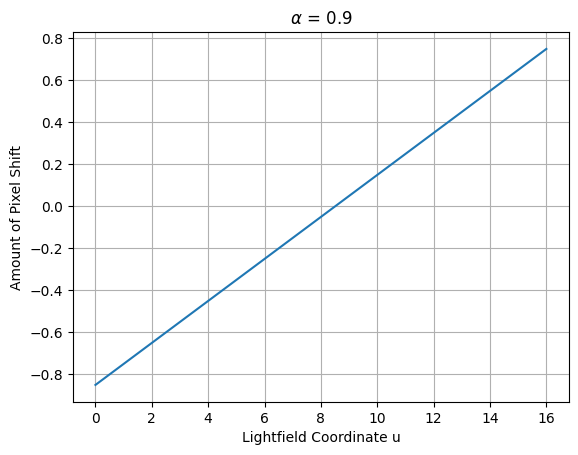

In [40]:
alpha = .9

shifts = get_shift_1D(img,alpha)

print(shifts.shape) # Should be vector with 17 entries

plt.plot(shifts)
plt.grid()
plt.title(r"$\alpha$ = " + str(alpha))
plt.xlabel("Lightfield Coordinate u")
plt.ylabel("Amount of Pixel Shift")

util_lightfield.save_fig_as_png('shift_1d')

## **Problem 2.5:** Shift all 1D Signals according to the calculated shifts

In the next step we'll have to actually implement the image shift/translation.

`shift_images_1d` takes the img and applies the shift that you've just calculated and shifts the images accordingly.

In [41]:
print(img.dtype)
print(img.shape)
print(shifts.shape)

uint8
(17, 400)
(17,)


In [42]:
from scipy.ndimage import shift
def shift_images_1d(img,shifts):
    """
    TODO:

    Use: scipy.ndimage.shift for the 1D-implementation

    Hint: Use mode = 'mirror' to deal with boundaries in a smarter way than zero-filling


    Args:
        img(ndarray): 2D-lightfield image with shape (17x300)
        shift(ndarray): shift array obtained from get_shift_1d

    Returns:
        out(ndarray): shifted lightfield with same shape as img

    """
    num_views, num_pixels = img.shape
    out = np.zeros_like(img)

    for i in range(num_views):
        shift_value = shifts[i]

        out[i, :] = shift(img[i, :], shift_value, mode='mirror')

    return out

In [43]:
img_shifted = shift_images_1d(img,shifts)

.///my_output_lightfield//image_shifted.png


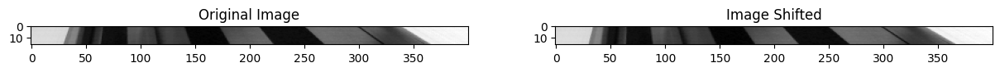

In [44]:
subplots([img, "Original Image"], [img_shifted, "Image Shifted"])

util_lightfield.save_fig_as_png('image_shifted')

## **Problem 2.6:** Average the 1D-Signal

Now all that is to do is to average the shifted image along the u-direction and you'll obtain the refocused 1D-signal

In [45]:
def average_1d_signal(img):
    """
    TODO:

    Averages the 2D-lightfield along the the lightfield coorinate

    Args:
        img(ndarray): 2D-lightfield image with shape (17x300)
    Returns:
         refocused(1d-np.array): 1D-array with shape (Num_pixel x1) that is refocused
    """
    refocused = np.mean(img, axis=0)
    return refocused

(400,)
.///my_output_lightfield//average_1d_signal.png


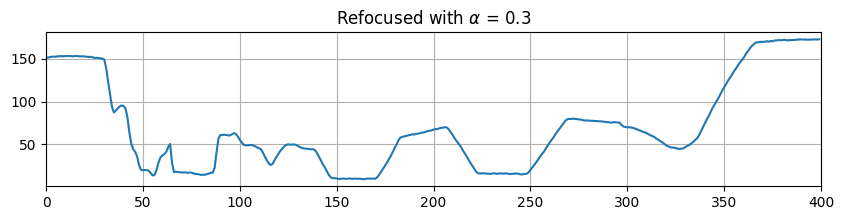

In [46]:
# Implement the function average_1d_signal
img_1d_refocused = average_1d_signal(img_shifted)

print(img_1d_refocused.shape)

plt.figure(figsize=(10,2))
util_lightfield.plot_1D_signal(img_1d_refocused,0.3)

util_lightfield.save_fig_as_png('average_1d_signal')

## **Problem 2.7:** Play around with digital refocusing

The following cell-block is a small interactive tool that allows you to refocus to different depths using the slider value. If you've implemented everything well, this should work out of the box. The following functions should have been implemented by you now:
1. `get_shift_1d`
2. `shift_images_1d`
3. `average_1d_signal`

Play around with it and try to develop a feeling how the refocusing algorithms works in 1D. It will be very similar in 2D-case, however thinking in 4D is slightly more complex than in 2D, but conceptually it's pretty much the same.

In [47]:
def f(alpha):
    plt.figure(figsize=(10,4))

    shifts = get_shift_1D(img,alpha)
    img_shifted = shift_images_1d(img,shifts)
    img_1d_refocused = average_1d_signal(img_shifted)


    plt.subplot(211)

    plt.imshow(img_shifted,interpolation="bilinear", aspect="auto",cmap='gray')


    plt.subplot(212)

    util_lightfield.plot_1D_signal(img_1d_refocused,alpha)
    plt.tight_layout()

    plt.show()


alpha_widget =  widgets.FloatSlider(value=1,min=-2, max=3, step=0.05)

interactive_plot = interactive(f, alpha = alpha_widget)
output = interactive_plot.children[-1]
interactive_plot

interactive(children=(FloatSlider(value=1.0, description='alpha', max=3.0, min=-2.0, step=0.05), Output()), _d…

### **Subtask:** Extract some meaninful $\alpha$-values

Play around with the interactive widget and write down a few values for $\alpha$ where the image focuses on different part of the 1D-signal.

A focused-signal is defined here where you see a sharp edge in the signal. What does the sharp edge represent in this signals ?

HINT: Think about that we're looking at at chessboard, now what does black and gray values represent here?

In [89]:
def get_alpha_values():
    """
    TODO:

    Write done here a list of interesting alpha values
    where you think it's worth to refocus at

    Returns:
        out(array or list): A list with interesting alpha values

    """
    return np.array([0.5, 1, 1.9, 2.5])

In [90]:
# Define alpha values that focus on different parts in the image

alpha_idxs = get_alpha_values()
print(type(alpha_idxs)) # Should be a list or a nunmpy array. Should have 3-5 different alpha positions that focus on different parts in the 1D image.

<class 'numpy.ndarray'>


## **Problem 2.8:** Run the following block which shows how to estimate DoF

The code below is a very simple approximative way to estimate the depth-of-field of our signal.

The main idea is to calculate the gradient (1D-derivative) in x-direction of the shifted-image and then average over the lightfield coordinate u.

Now, you should see some peaks whenever there was an edge in the original image. However, because we average the peaks should only be pronounced where the the line is perpendicular, otherwise the peaks will be blurred out. A blurred out peak corresponds to a signal that is outside the depth-of-field.

In this code, we apply a simple peak-finding algorithm where we use the prominence of the peak as an identifier if the image is in or out-of-focus.

There is nothing to implement for you. You can simply run this block and you'll see how it works. This code is also wrapped into the function `calculate_depth_of_field` which we're using below.

[]
[32 43]


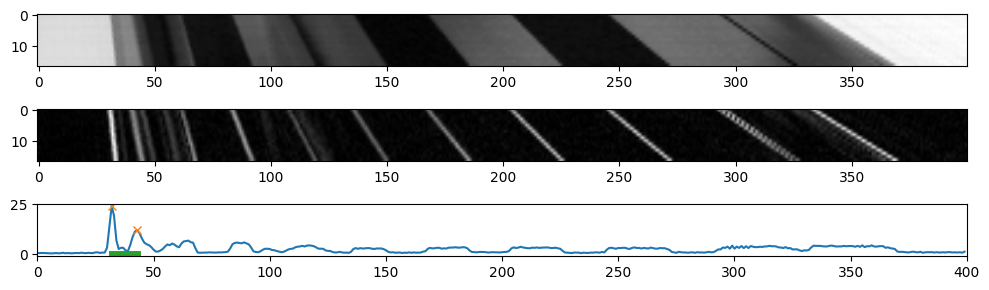

In [91]:
shifts = get_shift_1D(img,alpha_idxs[0])
img_shifted = shift_images_1d(img,shifts)


gradient_image = np.abs(np.gradient(img_shifted)[1])

plt.figure(figsize=(10,3))

plt.subplot(311)
plt.imshow(img_shifted,interpolation="bilinear", aspect="auto",cmap='gray')
plt.subplot(312)
plt.imshow(gradient_image,interpolation="bilinear", aspect="auto",cmap='gray')


mean_gradient = np.mean(gradient_image,axis=0)

plt.subplot(313)
plt.plot(mean_gradient)

plt.xlim(0,img_shifted.shape[1])

# These functions are very prone to deliver no results for certain alpha_values
# - if you cannot find value that work for the following code just go ahead

peaks_all, _ = scipy.signal.find_peaks(mean_gradient, prominence=10, width=5)
peaks_width, _ = scipy.signal.find_peaks(mean_gradient, prominence=10)

print(peaks_all)
print(peaks_width)

peaks = util_lightfield.listComplementElements(peaks_width, peaks_all)
peaks = np.array(peaks)

plt.plot(peaks, mean_gradient[peaks], "x")

img_refocused = average_1d_signal(img_shifted)

plt.plot([peaks[0],peaks[-1]],[0,0],linewidth=5)
plt.tight_layout()

## **Problem 2.9:** Visualize the refocused signal at different locations

Now run the following block where we have prepared some code that will plot the refocused 1D-signals depending on the alpha-values that you've chosen in your `get_alpha_values()` method.

This image should look so that you clearly see the focusing effect at 4 different image locations.

The orange line roughly defines the region where the 1D-image is focused.

.///my_output_lightfield//lightfield_refocus_1d_different_alpha.png


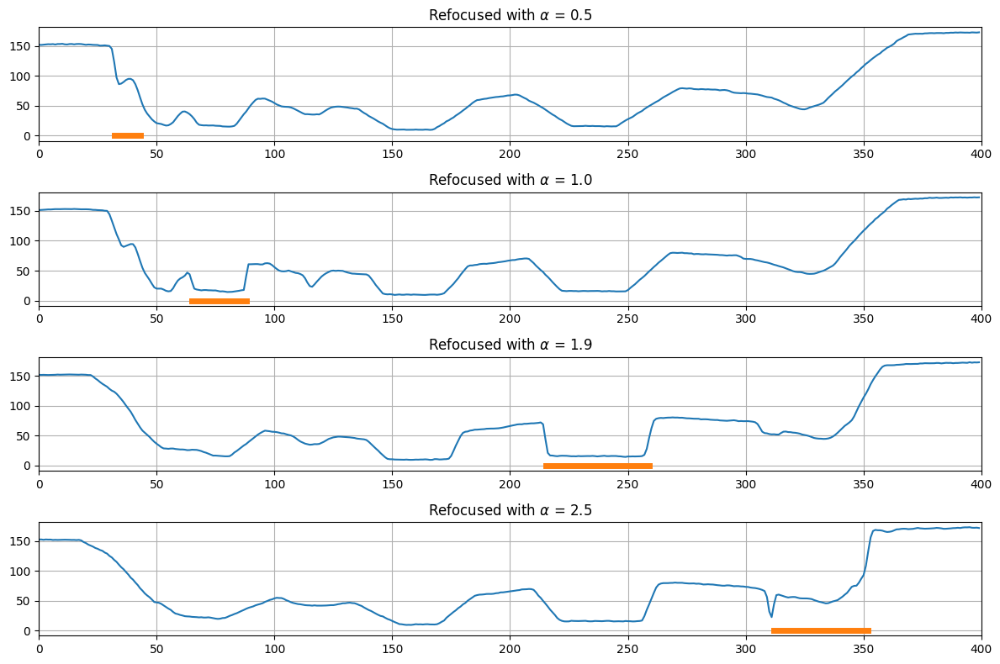

In [92]:
plt.figure(figsize=(12,8))

for k in range(len(alpha_idxs)):
    plt.subplot(len(alpha_idxs),1,k+1)
    shifts = get_shift_1D(img,alpha_idxs[k])
    img_shifted = shift_images_1d(img,shifts)

    img_refocused = average_1d_signal(img_shifted)

    util_lightfield.plot_1D_signal(img_refocused,alpha_idxs[k]) # Replace this text with alpha_idxs[k]

    p0,p1 = util_lightfield.calculate_field_of_depth(img_shifted)

    plt.plot([p0,p1],[0,0],linewidth=5)

plt.tight_layout()


util_lightfield.save_fig_as_png('lightfield_refocus_1d_different_alpha')

# **Problem 3:** Preparing for refocusing in 4D-lightfield space or 2D-images

Now that we've understood how refocusing works in 1D, we'll move over to digital refocusing in 2D.

## **Problem 3.1:** Understand the orientation properties of the lightfield

The following code should help you analyze the lightfield a bit better. In particular we want you to understand how the lightfield coorindates u and v are oriented. Those will define in which direction you have to shift your images later on

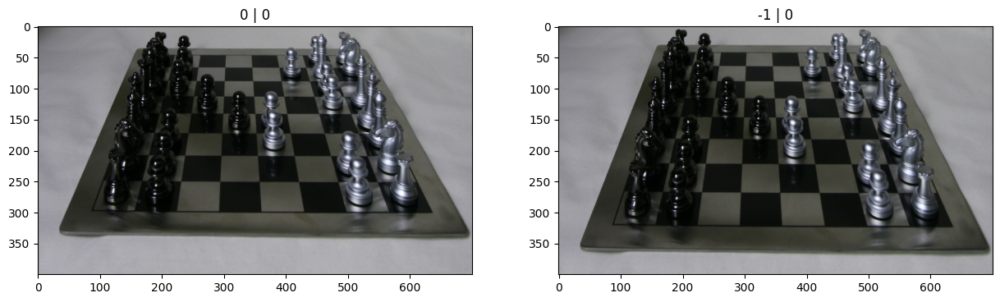

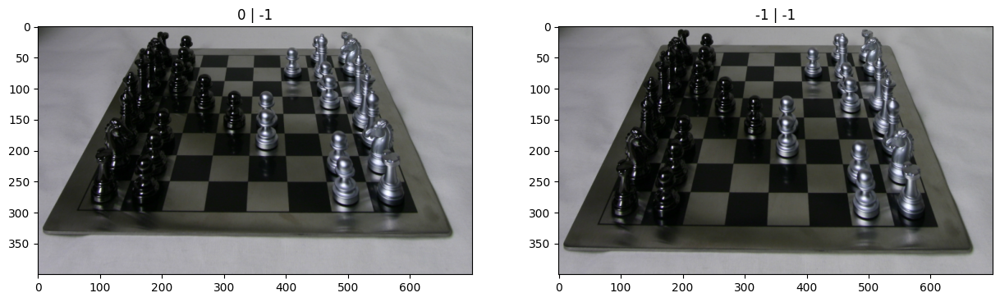

In [93]:
# Run the following code

subplots([data[0,0], "0 | 0"], [data[-1,0], "-1 | 0"])
subplots([data[0,-1], "0 | -1"], [data[-1,-1], "-1 | -1"])

Read more here:
https://graphics.stanford.edu/courses/cs348b-competition/cs348b-14/second_report.pdf

This is the formula that we have to implement. First, we write down the continuous formula, then the discretized version.

$E(s',t') = \int L(u,v,\frac{1}{\alpha}(s' - ( 1 - \alpha ) \cdot u ), \frac{1}{\alpha} ( t' - (1 - \alpha ) \cdot v ) ) du dv$

<br>
and here in discretized version:

$E(s',t') = \sum\limits_{k,p} L(u_k,v_p,\frac{1}{\alpha}(s' - ( 1 - \alpha ) \cdot u_k ), \frac{1}{\alpha} ( t' - (1 - \alpha ) \cdot v_p) )$

If you compare this to the 1D-version, this is very similar. However, now you have shifts in both directions which you need to calculate.

In [94]:
def get_shifts(lf_shape,alpha):
    """
    TODO:
    Calculates the amount of shift that needs to be done for each image
    in the light-field which depends on the refocus parameter alpha.
    The shift should be returned as two meshgrids for x and y direction.
    HINT: This is the straightforward extension from your method
    get_shift_1D which you implemented for 1D-refocusing
    HINT:You might need to reverse the direction of u or v shift
    You can do this by simply writing like:
    v = - v (if v is the linspace that describes your lightfield coordiantes in v-direction)
    Args:
        lf_shape(list): The shape of the lightfield (e.g. (17,17))
        alpha*(float): the refocus paramter
    Returns:
        DX,DY(ndarray): Meshgrid values that contains the amount of shift
            in x and y coordiante
    """
    # assume light field shape is 4D, go from -1/2 u, v to 1/2 u, v over s, t

    u, v = np.meshgrid(np.arange(-1*lf_shape[0]/2.0, lf_shape[0]/2.0, 1.0), np.arange(-1*lf_shape[1]/2.0, lf_shape[1]/2.0, 1.0), indexing='ij')

    # Calculate the amount of shift in u and v directions based on the given formula
    shift_u = (1 - alpha) * u
    shift_v = (1 - alpha) * v

    # Reverse the direction of v shift
    shift_v = -shift_v

    return shift_u, shift_v



.///my_output_lightfield//2D_shifts_overview.png


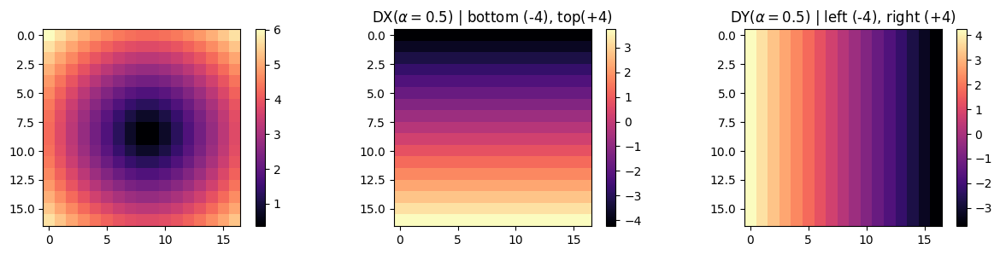

In [95]:
# Now, just like you did it for the 1D-signal, you will have to calculate the amount of shift for a given alpha.
# HINT: Since you're not working with 1D-signals, you are now working with 2D-meshgrid
# Hence, your output of the get_shifts positions should be a mehsgrid too. One meshgrid for the u coordinate,
# and one for the v coordinate.


alpha = 0.5

DX, DY = get_shifts(data.shape,alpha)

# The following plots should help you analyze if you have implemented the light-field shift function correctly:

plt.figure(figsize=(15,3))

plt.subplot(131)
plt.imshow(np.sqrt(DX**2 + DY**2), cmap = "magma")
plt.colorbar()

plt.subplot(132)
plt.imshow(DX, cmap = "magma")
plt.colorbar()
plt.title(r"DX($\alpha=0.5$) | bottom (-4), top(+4)")


plt.subplot(133)
plt.imshow(DY, cmap = "magma")
plt.colorbar()
plt.title(r"DY($\alpha=0.5$) | left (-4), right (+4)")


util_lightfield.save_fig_as_png('2D_shifts_overview')

## **Problem 3.2:** Implement a 2D-translation operation

Now we need to implement a function that translates an image given a 2D translation vector.

Luckily, there are many python packages available that are doing this for you. You just have to find a good package (e.g. skimage or openCV (speed ! ) that will do this job for you)

In [96]:
img = data[0,0]
print(img.shape)

(400, 700, 3)


In [97]:

def translate_image(img,dx,dy):
    """
    TODO:

    Translates an image by a local shift defined
    by dx and dy

    HINT: Use openCV function (e.g. warpAffine)

    Args:
        img(ndarray): RGB array or 2D array
        dx,dy(float): amount that image needs to translated

    """

    # standard openCV stuff copped from online
    rows, cols = img.shape[:2]

    # Define the translation matrix
    translation_matrix = np.float32([[1, 0, dx], [0, 1, dy]])

    # Apply the translation
    if len(img.shape) == 2:  # Grayscale image
        translated_image = cv2.warpAffine(img, translation_matrix, (cols, rows), borderMode=cv2.BORDER_REFLECT)
    else:  # Color image
        translated_image = cv2.warpAffine(img, translation_matrix, (cols, rows), borderMode=cv2.BORDER_REFLECT_101)


    return translated_image

(400, 700, 3)
(400, 700, 3)
.///my_output_lightfield//translate_image_2d.png


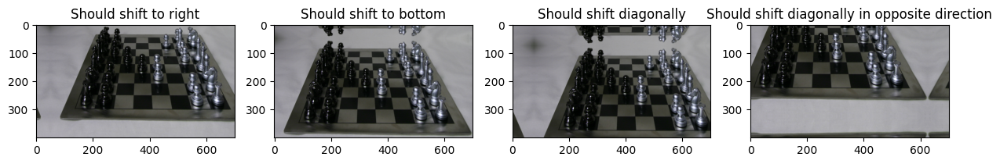

In [98]:
# You can use the following code to test out if your translation method has worked well

img = data[0,0]
print(img.shape)

img1 = translate_image(img,50,0)
print(img1.shape) #Should be the same as img.shape
I1 = [img1, "Should shift to right"]

img2 = translate_image(img,0,50)
I2 = [img2, "Should shift to bottom"]

img3 = translate_image(img,75,75)
I3 = [img3, "Should shift diagonally"]

img4 = translate_image(img,-75,-75)
I4 = [img4, "Should shift diagonally in opposite direction"]

subplots(I1, I2, I3, I4)

util_lightfield.save_fig_as_png('translate_image_2d')

## **Problem 3.3:** Aperture Simulation

The light-field can be interpreted as capturing images with a much larger aperture. However, the light-field is 4-dimensional and you can interprete each view as a capture with a very small aperture.

To remind yourself what the aperture is doing and what effect it is having on the captured images, please have a look at the following image. The linked article (where we've taken the image from is also quite instructive, if you want to give it another read)

---

<img src="https://maratstepanoff.com/wp-content/uploads/2018/12/Aperture-Range.png" width=700/>

`Read more here: https://maratstepanoff.com/aperture-in-photography/`

---

Our goal will be to write an algorithm that allows to refocus the 4D-lightfield to any depth-position that we want. This depth will be given by the parameter $\alpha$.

However, to accurately estimate the refocusing we should use a circular aperture instead of a rectangular aperture.

Why are we writing rectangular aperture here? If you remember how the light-field was captured, you'll realize that we captured this from a 17x17 grid which was rectangular.

We will have to write an algorithm that takes this into account, so let's begin.

---

### **Subtask:** Create the circular aperture

First we will create the circular mask. For this we have already implemented the function "get_disk_aperture" for you.

Just run the following cell which is visualizing the circular aperture for different radii.


HINT: Note that we are defining the circular aperture through its radius and not through the diameter. Because of this the shape of our aperture is always odd and we always have a well defined center.

(1, 1)
(3, 3)
(5, 5)
(7, 7)
(9, 9)
(11, 11)
(13, 13)
(15, 15)


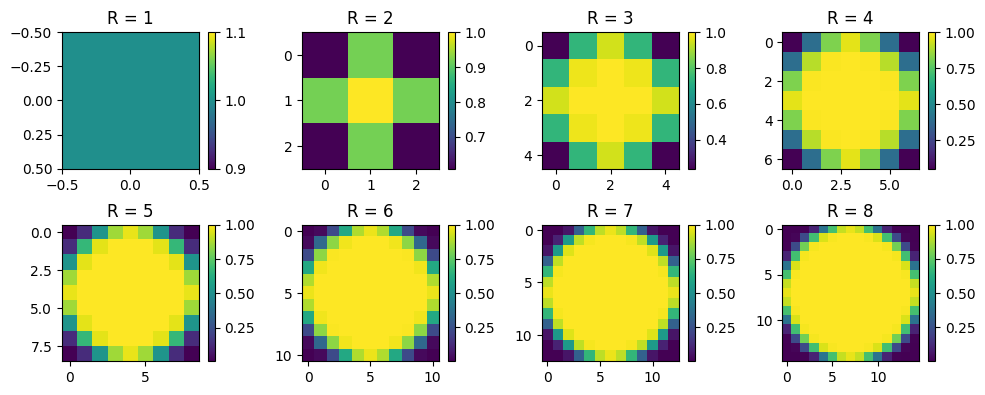

In [99]:
plt.figure(figsize=(10,4))

for k in range(8):
    plt.subplot(2,4,k+1)

    A_disk = util_lightfield.get_disk_aperture(k+1)
    print(A_disk.shape)
    im = plt.imshow(A_disk)
    plt.title("R = " + str(k+1))
    im.axes.figure.colorbar(im)

plt.tight_layout()

# **Problem 4:** Implement a pipeline for Computational Refocusing

Now it's actually time to implement the refocusing algorithm. We will go through this step by step.

---

### **Subtask:** Revisit call-by-reference in Python

Below is a small script that show-cases how call-by-reference works in Python. E.g. when we substract data from a larger images by assessing e.g. submatrices we're not doing copies of the data, but we're rather just getting the pointer to the location in memory.

In Computational Photography we're often working with large data which is memory consuming. Our goal should be to write memory-efficient code.

[[-0.88486642  1.77720219 -1.55265693  1.3994062 ]
 [-2.01870472 -1.22848671  0.63063789 -0.2266129 ]
 [ 0.85140162  0.52479228 -1.58956715 -0.20392759]
 [-0.60607738  1.86950448  0.65105245  0.8710002 ]]


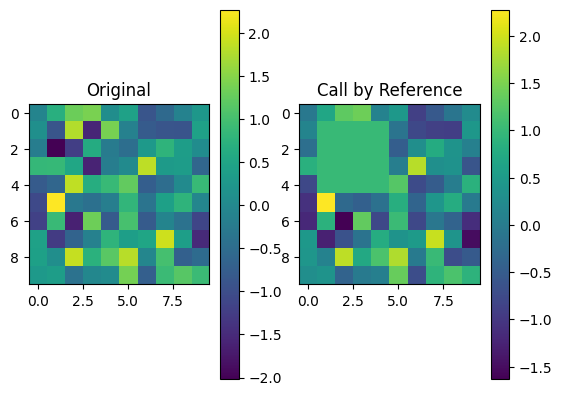

In [100]:
# An example of how call-by-reference in python works
# You can read more here: https://ecco-v4-python-tutorial.readthedocs.io/ECCO_v4_Operating_on_Numpy_Arrays.html

A = np.random.randn(10,10) # Create a random matrix

plt.subplot(121)
im = plt.imshow(A)
plt.title("Original")
im.axes.figure.colorbar(im)

# Define B to be a submatrix of A. This is call-by-reference and the entries of B and
# respective entries in A share (!) the SAME memory (!)
B = A[1:5,1:5]
print(B)
B[:,:] = 1 # Reset all values inside to 1

plt.subplot(122)
im = plt.imshow(A) # Even though we only changed values in B, the values in A shold now be changed!
plt.title("Call by Reference")
im.axes.figure.colorbar(im)

## **Problem 4.1:** Write a image crop function

Now we'll need to write a function that crops part of the light-field image according to the size of the used aperture-mask.

E.g. if we use a aperture-mask that has a diameter of 7 pixels we don't work on the complete lightfield but only with a sub-section of this data.

Why are we doing this: If we work with only a region of 7x7 we only need to translate $7^2=49$ images instead of $17^2=289$. This saves a lot of computation time.

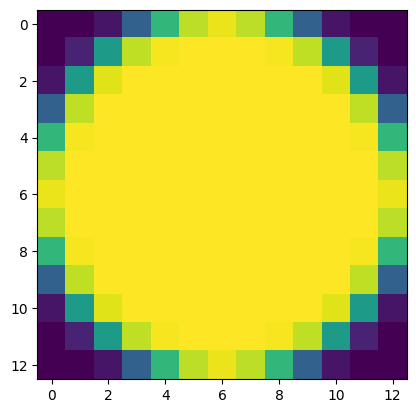

In [101]:
# get a mask for testing out
A_mask = util_lightfield.get_disk_aperture(7)
plt.imshow(A_mask)

In [102]:
print(data.shape)
print(A_mask.shape)

(17, 17, 400, 700, 3)
(13, 13)


In [103]:
def crop_part(data, A_mask=None):
    """
    Crops part of the image according to the A_mask used.
    The crop should be performed at the CENTER of the lightfield.

    DO NOT USE NUMPY COPY FUNCTIONS.

    Use call-by-reference by simply assessing the subindices and return those.

    HINT: Calculate what the center of the lightfield should be. Then subtract
    the A_mask.shape[0] / 2 to get the top-left index where you should start cropping.

    HINT: If A_mask is None, simply return data, since nothing is to be cropped.

    Args:
        data(ndarray): lightfield data
        A_mask(ndarray): the aperture image (e.g., 17x17 or 5x5)
    Returns:
        out(ndarray): The cropped lightfield. The first 2 dimensions should have shape of A_mask.
    """
    try:
        if A_mask is None:
            return data

        # Lightfield is numpy not opencv so follows y, x format
        # take center and subtract half of mask to get top left
        start_x = data.shape[0] // 2 - A_mask.shape[0] // 2
        start_y = data.shape[1] // 2 - A_mask.shape[1] // 2

        # Return cropped lightfield
        out = data[start_x:start_x + A_mask.shape[0], start_y:start_y + A_mask.shape[1]]

        return out
    except Exception as e:
        print(f"An error occurred: {e}")
        return data


In [104]:
# But should also work if no mask is provided (i.e. return the same data)
data_cropped = crop_part(data)

print("If no mask is used")
print(data.shape)
print(data_cropped.shape) # should be the same as data.shape since we're not using any mask

# Should work for masks
data_cropped = crop_part(data,A_mask)

print("If a mask is used")
print(data.shape)  # should be (17,, 17,  400, 700, 3)
print(data_cropped.shape) # should be (13, 13, 400, 700, 3) for a radius of r = 7

If no mask is used
(17, 17, 400, 700, 3)
(17, 17, 400, 700, 3)
If a mask is used
(17, 17, 400, 700, 3)
(13, 13, 400, 700, 3)


.///my_output_lightfield//cropped2d_example.png


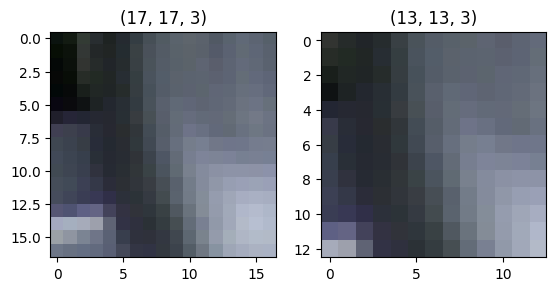

In [105]:
# Just visualize that the crop has actually worked

plt.subplot(121)
plt.imshow(data[:,:,200,550])
plt.title(data[:,:,200,550].shape)
plt.subplot(122)
plt.imshow(data_cropped[:,:,200,550])
plt.title(data_cropped[:,:,200,550].shape)

util_lightfield.save_fig_as_png('cropped2d_example')

## **Problem 4.2:** Implement the shift_lightfield function

Now we have the following pieces already implemented:
1. Get the shifts according to the refocusing formula
2. Translate an image function
3. Crop light-field to the correct size


Now we need to shift each image in the light-field data according to the corresponding shift that you have calculated above

In [106]:
DX, DY = get_shifts(data_cropped.shape,alpha)
print(DX.shape)
print(DY.shape)
print(data_cropped.shape)

(13, 13)
(13, 13)
(13, 13, 400, 700, 3)


In [107]:

def shift_lightfield(data, DX, DY):
    """
    Shifts each image in the light-field according to the
    shifts that were specified in get_shifts

    Args:
        data (ndarray): The input lightfield data
        DX, DY (meshgrid): the shifts in x and y for each lightfield position

    Returns:
        out (ndarray): a lightfield that was shifted. Same shape as data
    """
    print(data.shape)
    x_views, y_views, num_rows, num_cols, num_channels = data.shape

    out = np.zeros_like(data)

    # Iterate through each dim
    for x_view in range(x_views):
      for y_view in range(y_views):
        for row in range(num_rows):
          for col in range(num_cols):
            # Assign value at current point to point shifted by dy and dx
            new_row = (row + int(DY[x_view, y_view])) % num_rows
            new_col = (col + int(DX[x_view, y_view])) % num_cols

            out[x_view, y_view, new_row, new_col, :] = data[x_view, y_view, row, col, :]

    return out


In [108]:
# We're recalculating how much we have to shift each images
# This function should already be implemented by you
DX, DY = get_shifts(data_cropped.shape,alpha)

# This is the function that you have to implement now
tmp_lf = shift_lightfield(data_cropped,DX,DY)

(13, 13, 400, 700, 3)


In [109]:
# Test that the dimensions after shifting still match up:

print(data_cropped.shape)
print(tmp_lf.shape) # should be the same
print(A_mask.shape)

(13, 13, 400, 700, 3)
(13, 13, 400, 700, 3)
(13, 13)


## **Problem 4.3:** Average the shifted lightfield

Now that you've shifted the images, all that is left to do is to average your shifted lightfield. If we wouldn't have an aperture mask this would be straightforward and we could just use the np.mean function.

However, we have to account for the aperture mask. The easiest way to deal with this is to weight the lightfield by multiplying the aperture function element-wise to the light-field data.

In [110]:
def weight_shifted_ligthfield(data, mask=None):
    """
    Weights the lightfield according to the mask that is provided.

    Args:
        data (ndarray): lightfield data (17, 17, Nx, Ny, 3)
        mask (ndarray): 2D-matrix of the aperture mask function (can be None if no mask provided)

    Returns:
        out (ndarray): weighted lightfield with the same shape
    """
    if mask is None:
        # No mask provided, return original data
        return data

    # Reshape to correct shape for broadcasting
    mask = mask[:, :, None, None, None]

    # multiply by mask weights
    out = data * mask

    return out

In [111]:
# If not mask is given just return the same matrix
weighted_lf = weight_shifted_ligthfield(tmp_lf)
print(weighted_lf.shape)

# If a mask is given weight the matrix!
weighted_lf = weight_shifted_ligthfield(tmp_lf,A_mask)
print(weighted_lf.shape)

(13, 13, 400, 700, 3)
(13, 13, 400, 700, 3)


## **Subtask:** Check if the averaging function worked well

Just run the following cell. If you've implemented everything correctly, this should work out of the box.

.///my_output_lightfield//2d_aperture_weighting.png


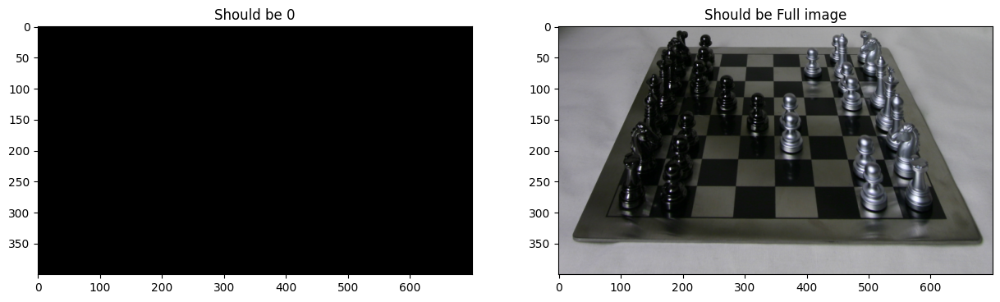

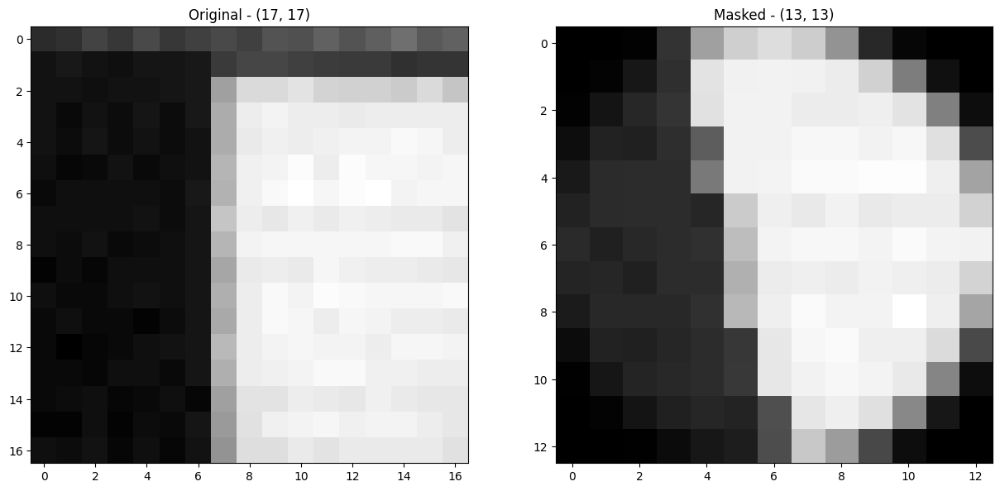

In [112]:
subplots([weighted_lf[0,0,:,:]/255, "Should be 0"], [weighted_lf[5,5,:,:]/255, "Should be Full image"])


# Choose a value that shows an interesting sub-aperture image
my_x = 300
my_y = 350
img1 = data[:,:,my_x,my_y,0]
img2 = weighted_lf[:,:,my_x,my_y,0]

subplots([img1, "Original - " + str(img1.shape)], [img2, "Masked - " + str(img2.shape)])

util_lightfield.save_fig_as_png('2d_aperture_weighting')

## **Problem 4.4:** Average the shifted lightfield

After weighting all that is left, is to average the image.

*NOTE:* If there's no mask you can simply use np.mean to calculate the average. However, because there is an aperture mask you need to normalize your image correclty. The easiest way to do this is to simply calculate the sum over the light-field calculate and then divide by the sum of the aperture_mask to calcualte the average. Make sure to cast your final result into uint8 so that you don't have any problems with image display in matplotlib

In [113]:
print(tmp_lf.shape)
print(A_mask.shape)

(13, 13, 400, 700, 3)
(13, 13)


In [114]:
def average_shifted_lightfield(tmp_lf,A_mask=None):
    """

    Average the registered lightfield. The averaging should be done
    for each channel separately. After that your result will be the refocused image.

    If no mask is provided (i.e. A_mask == None) you can simply use the mean

    However (this is slightly trickier): if a mask is provided the lightfield
    now is already weighted, i.e. the mean of the image would undersoot the
    actual value.

    In order to get a "weighted" mean simply sum up all values and the normalize
    by the sum of all values of A_mask which will return you the weighted mean.


    HINT: np.mean and np.sum allows you to do this without writing a for-loop
    for the color channels! Just specify the axis!

    HINT: Try to cast your final image into uint8
    to avoid any problems with plt.matplotlib

    You can use something like this:     refocused = refocused.astype(np.uint8)
    (However you here need to make sure that you values are well rescaled between 0 and 255.)

    Args:
        tmp_lf(ndarray): The lightfield after it was cropped and weighted
        A_mask(ndarray): The aperture mask (can also be 0)

    Returns:
        out(ndarray 0 uint8): an RGB image which should now be refocused

    """
    try:
        if A_mask is None:
            refocused = np.mean(tmp_lf, axis=(0, 1)) # if no mask , use mean
        else:
            mult = tmp_lf * A_mask[:,:,None, None, None]
            weighted_sum = np.sum(mult, axis = (0,1))
            sum_mask = np.sum(A_mask)
            refocused = weighted_sum / sum_mask
        refocused = np.clip(refocused, 0, 255).astype('uint8')

        return refocused

    except Exception as e:
        print(f"Error: {e}")
        return None

(13, 13, 400, 700, 3)
248


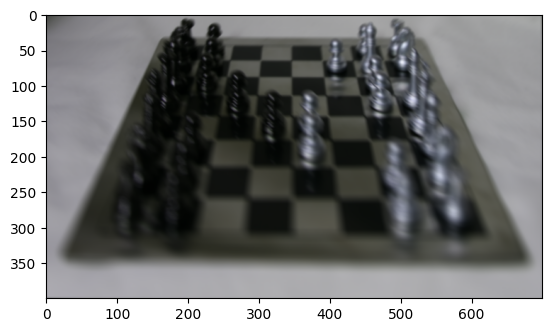

In [115]:
refocused = average_shifted_lightfield(tmp_lf,A_mask)
print(refocused.max())
plt.imshow(refocused)

## Problem 4.5: Test your light-field implementation

We have combined the complete refocusing pipeline for you in the function "compute_refocused". Just run the following and see if it works.

If it doesn't work, try to debug your functions inside until it works!

In the cell after, we've implemented a small interactive widget that allows you to play around with your implementation more!

In [116]:
## Already implemented for you

def compute_refocused(data,alpha,A_mask = None):

    data_tmp = crop_part(data,A_mask)

    DX, DY = get_shifts(data_tmp.shape,alpha)

    tmp_lf = shift_lightfield(data_tmp,DX,DY)

    tmp_lf = weight_shifted_ligthfield(tmp_lf,A_mask)

    refocused = average_shifted_lightfield(tmp_lf,A_mask)

    return refocused

---
*Note:* The code block below might take few minutes for computation

(9, 9, 400, 700, 3)
(9, 9, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


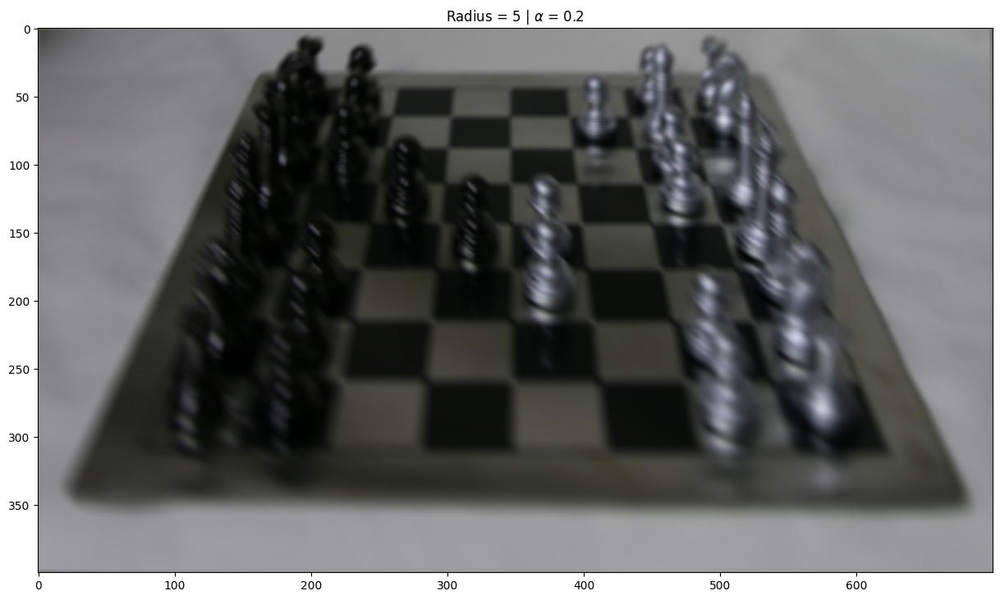

In [117]:
radius = 5 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 0.2 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

(17, 17, 400, 700, 3)
(17, 17, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


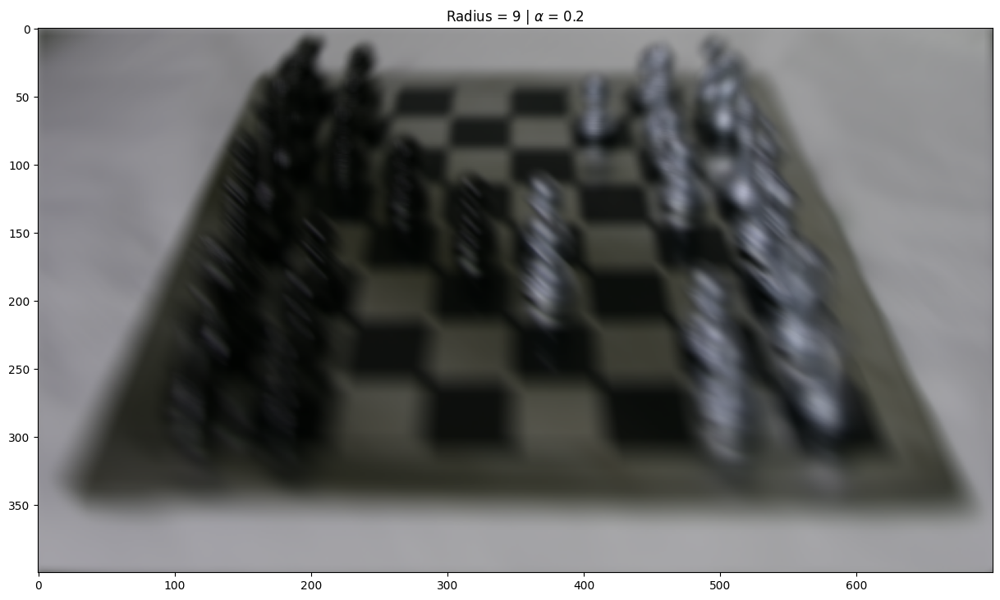

In [118]:
radius = 9 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 0.2 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

(9, 9, 400, 700, 3)
(9, 9, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


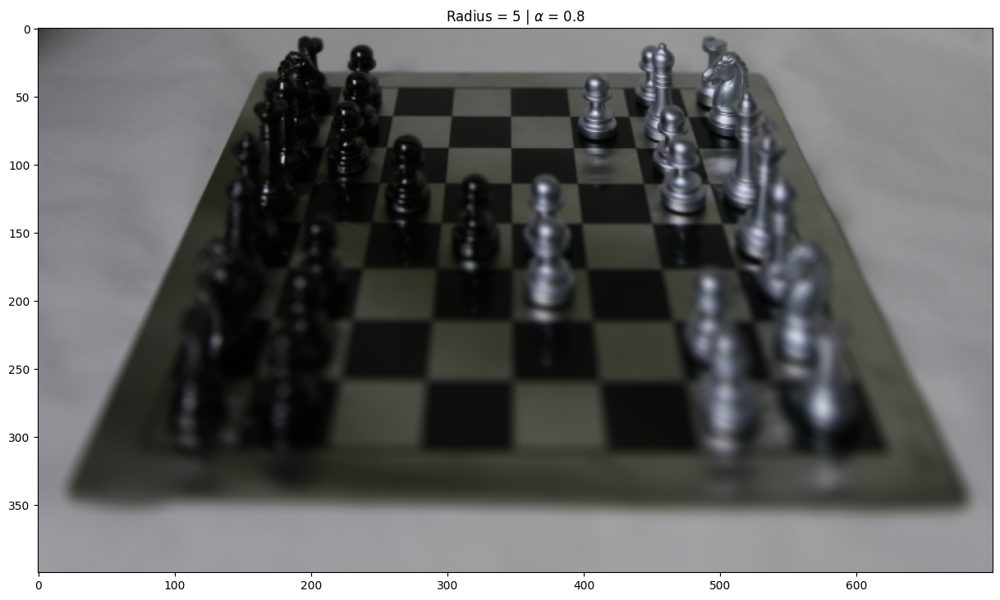

In [119]:
radius = 5 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 0.8 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

(17, 17, 400, 700, 3)
(17, 17, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


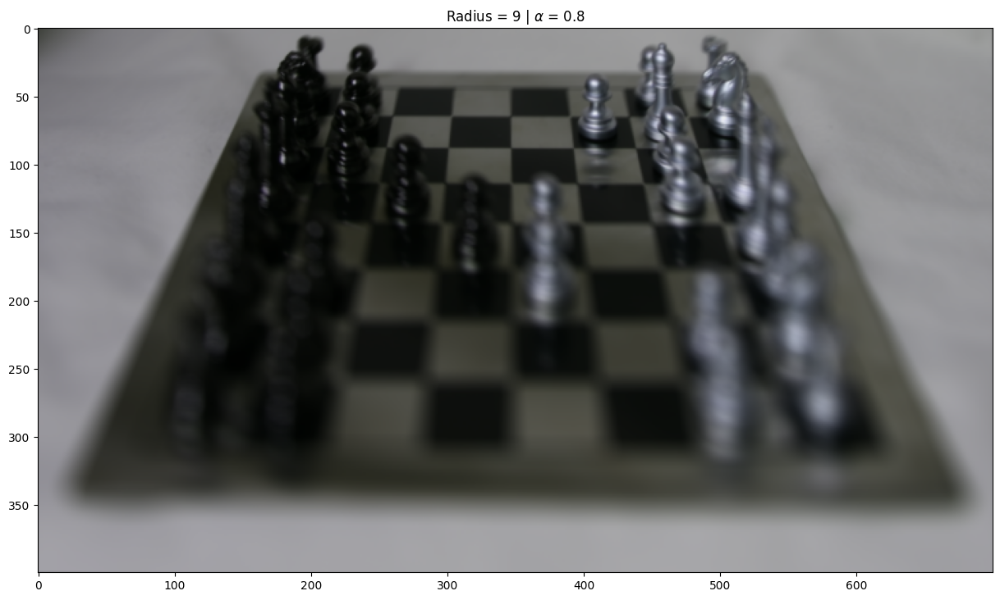

In [120]:
radius = 9 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 0.8 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

(5, 5, 400, 700, 3)
(5, 5, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


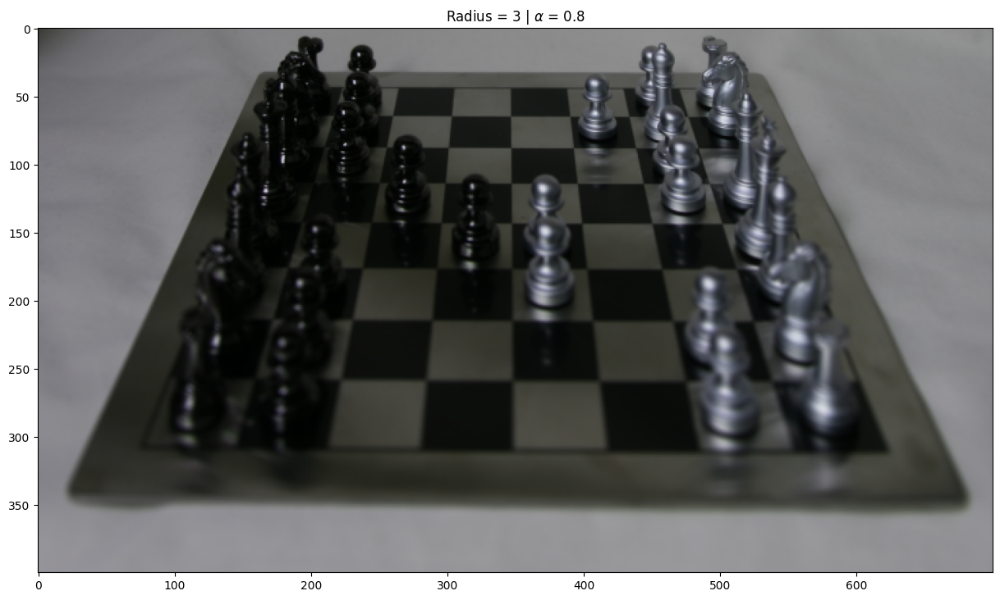

In [123]:
radius = 3 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 0.8 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

(9, 9, 400, 700, 3)
(9, 9, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


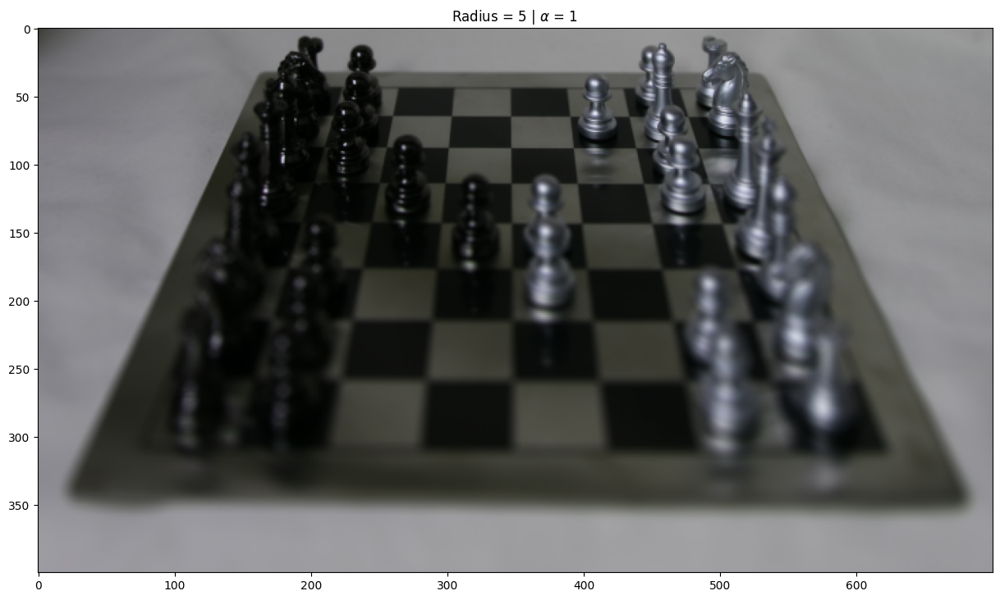

In [124]:
radius = 5 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 1 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

(5, 5, 400, 700, 3)
(5, 5, 400, 700, 3)
.///my_output_lightfield//lightfield_refocused_2d.png


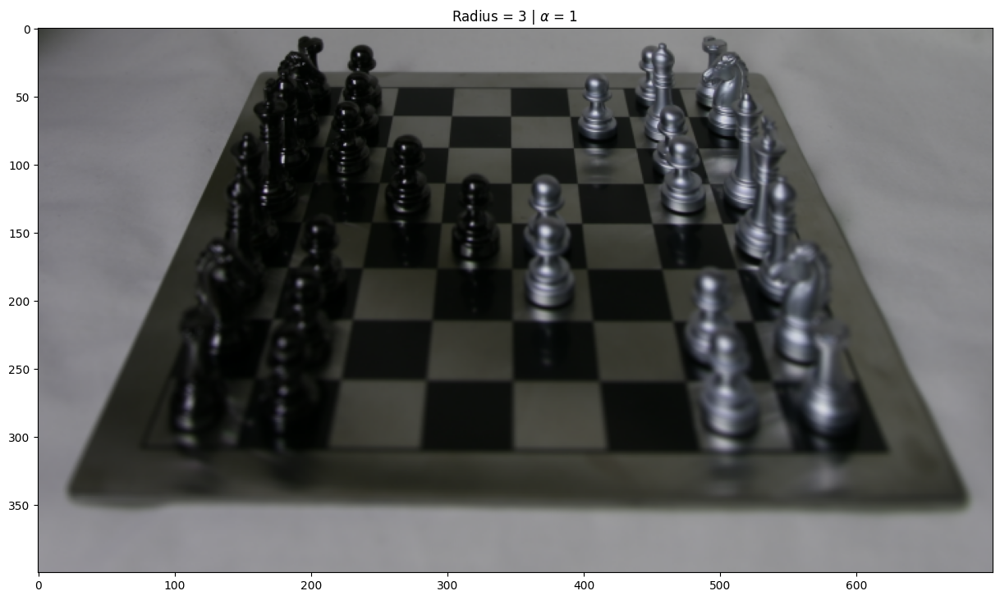

In [125]:
radius = 3 # Feel free to play around with this
A_mask = util_lightfield.get_disk_aperture(radius)
alpha = 1 # Feel free to play around with this

refocused = compute_refocused(data,alpha,A_mask)

plt.figure(figsize=(15,10))
plt.imshow(refocused)
plt.title("Radius = " + str(radius) + r" | $\alpha$ = " + str(alpha))

util_lightfield.save_fig_as_png('lightfield_refocused_2d')

Use the code below to zip your results folder so that you can download it from the Colab notebook onto your computer.

In [121]:
!zip -r /content/my_output_lightfield.zip /content/my_output_lightfield/

	zip warning: name not matched: /content/my_output_lightfield/

zip error: Nothing to do! (try: zip -r /content/my_output_lightfield.zip . -i /content/my_output_lightfield/)
